# Table of Contents

1. [Imports](#imports)

2. [Data Processing](#datapro)

    2.1. [Loading the dataset](#dataset)
   
    2.2. [Data Overview](#overview)
   
    2.3. [Data Visualization](#dataviz)
   
    2.4. [Data Analysis](#dataanal)
   
3. [Machine Learning](#ml)

   3.1. [Random Forest](#randomforest)
   
   3.2. [Neural Network](#network)
   
   3.3. [XGBoost](#xgboost)
   
   3.4. [Explainability](#explain)
   
4. [Dashboard](#dashboard)
   
   4.1  [Dashboard basics](#basic_dash)

   4.2  [ML Algorithms for Dashboard](#ml_dash)

   4.3  [Dash Elements](#ele_dash)

   4.4  [Dash Page 2: Machine Learning Diagnosis](#page2_dash)

   4.5  [Dash Page 1: Data Overview](#page1_dash)

!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install seaborn
!pip install plotly
!pip install category_encoders
!pip install scikit-learn
!pip install scikeras
!pip install keras
!pip install xgboost
!pip install scipy
!pip install imbalanced-learn
!pip install dash
!pip install dash-bootstrap-components
!pip install shap

# Imports <a id='imports'></a>

In [4]:
# General
import warnings 
warnings.filterwarnings('ignore', category=FutureWarning)
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from imblearn.pipeline import Pipeline

# Kaggle API for dataset loading
from kaggle.api.kaggle_api_extended import KaggleApi

# Data Cleaning and Preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from scipy.cluster import hierarchy

# Machine Learning Models and Evaluation
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from scikeras.wrappers import KerasClassifier
from keras.models import Sequential
from keras.layers import Dense, Dropout, Input
from keras.optimizers import Adam, SGD
import xgboost as xgb

# Clustering Algorithms
from sklearn.cluster import KMeans, DBSCAN
from scipy.cluster import hierarchy

# Model Evaluation Metrics
from sklearn.metrics import (
    r2_score, mean_absolute_error, mean_squared_error, f1_score, roc_auc_score,
    precision_score, recall_score, accuracy_score, classification_report, confusion_matrix,
    roc_curve
)

# Cross-Validation and Model Selection
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_predict, GridSearchCV

# Handling Imbalanced Data
from imblearn.over_sampling import SMOTE

# Dashboard Development
from dash import Dash, html, dcc, callback, Output, Input, dash_table
import dash_bootstrap_components as dbc

# SHAP for Model Interpretability
import shap

# Dashbord 
from dash import Dash, html, dcc, callback, Output, Input, dash_table
import dash_bootstrap_components as dbc
import matplotlib.patches as patches
import io
import base64
import plotly.express as px
import plotly.io as pio
import emoji

# Data Processing <a id='datapro'></a>

## Loading the Dataset <a id='dataset'></a>

In [5]:
os.environ['KAGGLE_USERNAME'] = 'alenarzaeva'
os.environ['KAGGLE_KEY'] = '025304d2f274607b8ce6e75b00b94f9f'
dataset_name = 'uciml/breast-cancer-wisconsin-data'

api = KaggleApi()
api.authenticate()
api.dataset_download_files(dataset_name, path='uciml/breast-cancer-wisconsin-data', unzip=True)

df = pd.read_csv('uciml/breast-cancer-wisconsin-data/data.csv')


# Laden der Daten aus einer CSV-Datei
# df = pd.read_csv('data.csv')
# df

Dataset URL: https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data


## Data overview <a id='overview'></a>

In [6]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [7]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [8]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [9]:
print("\nDescriptive Statistics:")
print(df.describe())
# The descriptive statistics provide basic metrics such as the mean, standard deviation, and quantiles for each numerical column.


Descriptive Statistics:
                 id  radius_mean  texture_mean  perimeter_mean    area_mean  \
count  5.690000e+02   569.000000    569.000000      569.000000   569.000000   
mean   3.037183e+07    14.127292     19.289649       91.969033   654.889104   
std    1.250206e+08     3.524049      4.301036       24.298981   351.914129   
min    8.670000e+03     6.981000      9.710000       43.790000   143.500000   
25%    8.692180e+05    11.700000     16.170000       75.170000   420.300000   
50%    9.060240e+05    13.370000     18.840000       86.240000   551.100000   
75%    8.813129e+06    15.780000     21.800000      104.100000   782.700000   
max    9.113205e+08    28.110000     39.280000      188.500000  2501.000000   

       smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
count       569.000000        569.000000      569.000000           569.000000   
mean          0.096360          0.104341        0.088799             0.048919   
std           0.0140

### Convert Diagnosis to 0/1 (object/int)

In [10]:
# Conversion of the 'diagnosis' column to 0 and 1 (B = Benign, M = Malignant)
df['diagnosis'] = df['diagnosis'].replace({'B': 0, 'M': 1})
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


### Checking for NaN and missing values

In [11]:
# Checking for missing values in each feature
print("\nNumber of missing values per column:")
print(df.isnull().sum())
# Meaning: This step shows the number of missing values in each column to determine if data cleaning is necessary.


Number of missing values per column:
id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
f

In [12]:
nan_columns = df.columns[df.isna().any()].tolist()
print("\nColumns with NaN values:")
print(nan_columns)


Columns with NaN values:
['Unnamed: 32']


In [13]:
# Checking for duplicates
print("\nNumber of duplicates:")
print(df.duplicated().sum())
# Meaning: This step shows the number of duplicate rows in the DataFrame to ensure no redundant data is present.

# # Removing duplicates if present
# df_clean = df_clean.drop_duplicates()  # Removes duplicate rows from the data


Number of duplicates:
0


### Deleting unnecessary columns (id/NaN)

In [14]:
# Removing the 'id' column as it does not contain relevant information for the analysis
df_clean = df.drop(columns=['id'])
df_clean

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [15]:
# Removing columns that contain only NaN values
df_clean = df_clean.dropna(axis=1)  # Removes columns that contain only NaN values

# Removing rows with missing values
df_clean = df_clean.dropna()  # Removes rows that contain missing values

## Data Visualization <a id='dataviz'></a>

### Countplot for the distribution of M and B
The countplot shows the distribution of diagnosis classes in the data, i.e., how many benign and malignant cases are present.

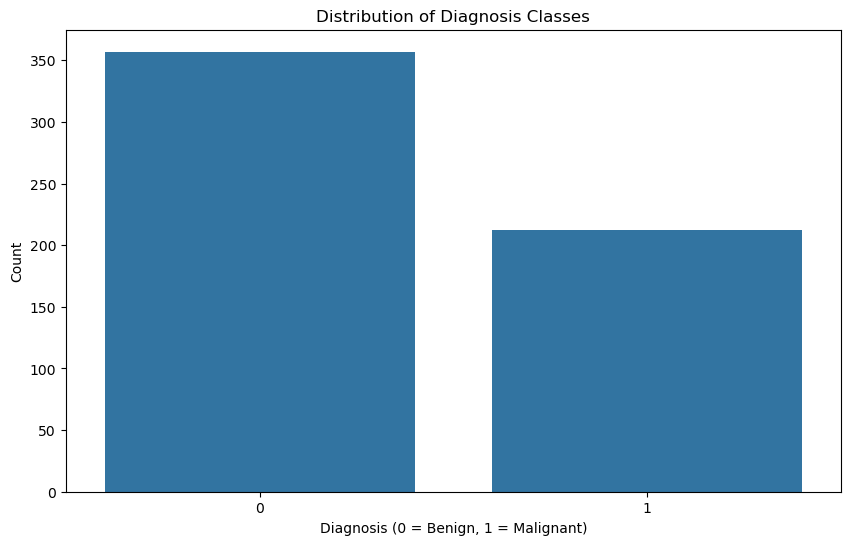

In [16]:
# sns.pairplot(df, hue='diagnosis')   # Not executed, as the notebook takes too long to run
# plt.show()

# Visualization of the distribution of diagnosis classes
plt.figure(figsize=(10, 6))
sns.countplot(x='diagnosis', data=df_clean)
plt.title('Distribution of Diagnosis Classes')  # Title of the plot
plt.xlabel('Diagnosis (0 = Benign, 1 = Malignant)')  # X-axis label
plt.ylabel('Count')  # Y-axis label
plt.show()

### Histograms

These histograms show the distribution of values for the features. They help identify the data distribution and potential outliers.

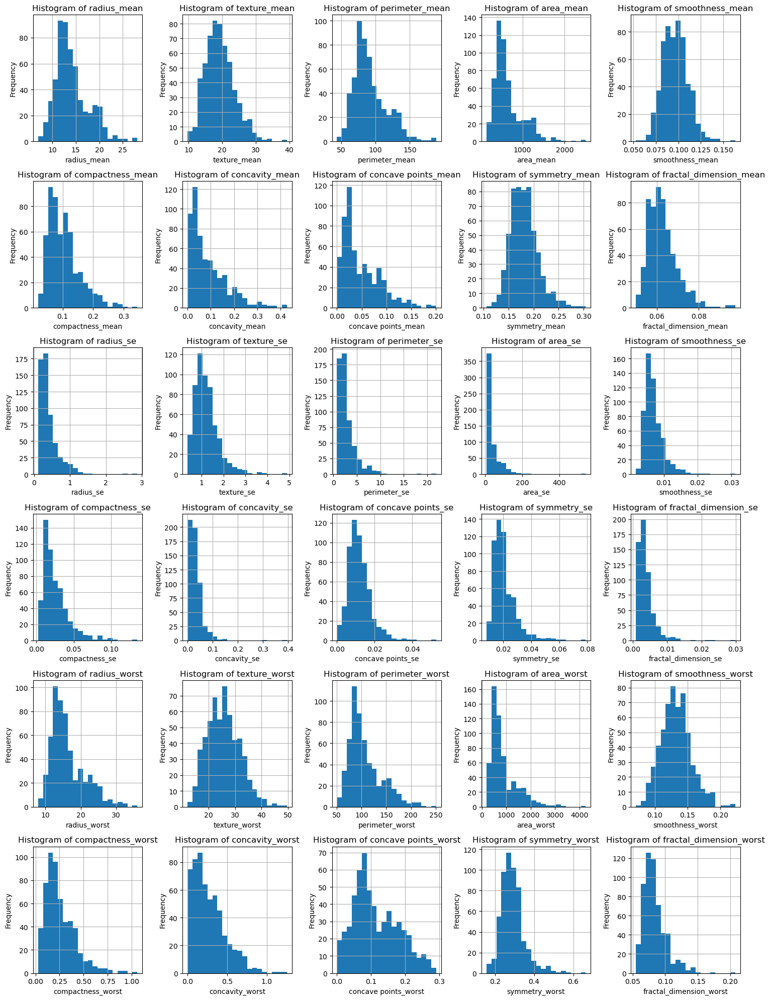

In [17]:
# Histograms for all features
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 
            'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 
            'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 
            'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 
            'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 
            'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']

plt.figure(figsize=(15, 20))  # fig size
for i, feature in enumerate(features):
    plt.subplot(6, 5, i+1)  # 6x5 grid layout
    df_clean[feature].hist(bins=20)
    plt.title(f'Histogram of {feature}')  # Histogram title
    plt.xlabel(feature)  # X-axis label
    plt.ylabel('Frequency')  # Y-axis label
plt.tight_layout()
plt.show()

### Boxplots

The boxplot shows the distribution of features by diagnosis. It helps identify differences in distribution and potential outliers.

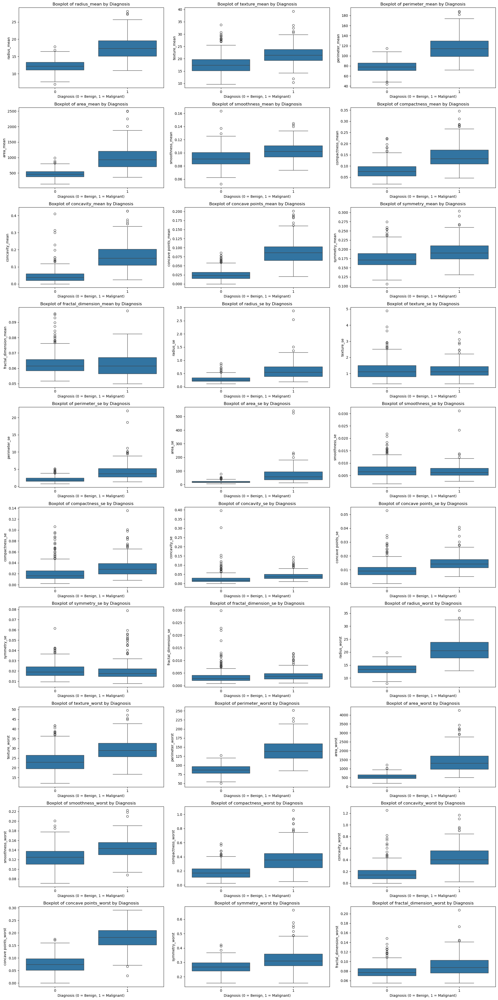

In [18]:
# Creation of Boxplots
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 
            'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 
            'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 
            'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 
            'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 
            'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']

plt.figure(figsize=(20, 40))  
for i, feature in enumerate(features):
    plt.subplot(10, 3, i+1)  
    sns.boxplot(x='diagnosis', y=feature, data=df_clean)
    plt.title(f'Boxplot of {feature} by Diagnosis')  
    plt.xlabel('Diagnosis (0 = Benign, 1 = Malignant)') 
    plt.ylabel(feature)  
plt.tight_layout()
plt.show()

### KDE Curves

Overlap of Curves:
If the KDE curves for benign and malignant diagnoses overlap significantly, it indicates that the feature alone is likely not very effective at distinguishing between benign and malignant diagnoses.

Separation of Curves:
If the KDE curves for benign and malignant diagnoses are clearly separated, it means that this feature has good discriminative power between benign and malignant diagnoses.

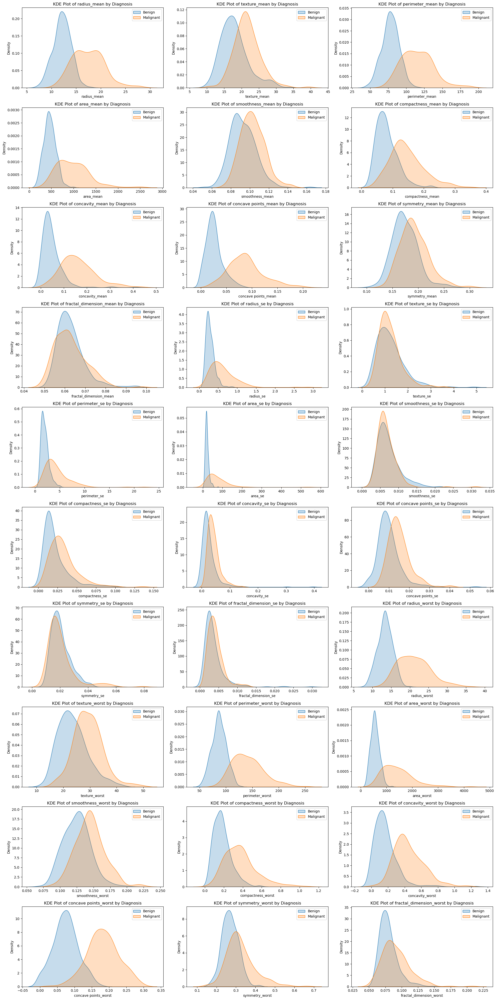

In [19]:
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 
            'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 
            'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 
            'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 
            'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 
            'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']

plt.figure(figsize=(20, 40))  # Adjust figure size for all plots
for i, feature in enumerate(features):
    plt.subplot(10, 3, i+1)  # 10x3 grid layout for the subplots
    sns.kdeplot(df_clean[df_clean['diagnosis'] == 0][feature], label='Benign', shade=True)
    sns.kdeplot(df_clean[df_clean['diagnosis'] == 1][feature], label='Malignant', shade=True)
    plt.title(f'KDE Plot of {feature} by Diagnosis')  # Plot title
    plt.xlabel(feature)  # X-axis label
    plt.ylabel('Density')  # Y-axis label
    plt.legend()  # Add legend
plt.tight_layout()
plt.show()


### Histograms with KDE
The KDE curve indicates the likelihood of data values falling within a certain range and provides a smoother alternative to the histogram for displaying data distribution.

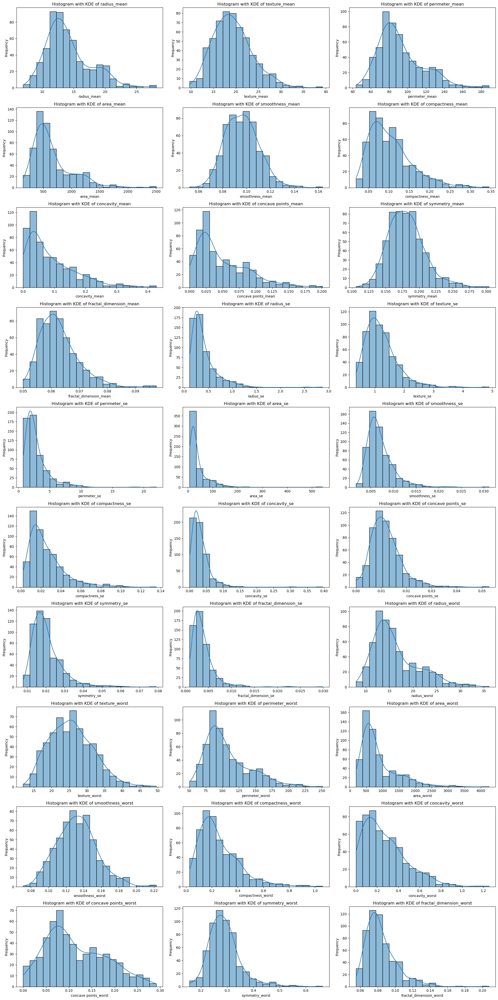

In [20]:
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 
            'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 
            'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 
            'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 
            'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 
            'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']

plt.figure(figsize=(20, 40))  # Adjust figure size for all plots
for i, feature in enumerate(features):
    plt.subplot(10, 3, i+1)  # 10x3 grid layout for the subplots
    sns.histplot(df_clean[feature], kde=True, bins=20)
    plt.title(f'Histogram with KDE of {feature}')  # Plot title
    plt.xlabel(feature)  # X-axis label
    plt.ylabel('Frequency')  # Y-axis label
plt.tight_layout()
plt.show()


### Scatterplots
Scatterplots are extremely useful for visualizing relationships between two variables and identifying patterns, trends, and outliers. They can reveal both linear and non-linear relationships and help perform an initial analysis of the data.

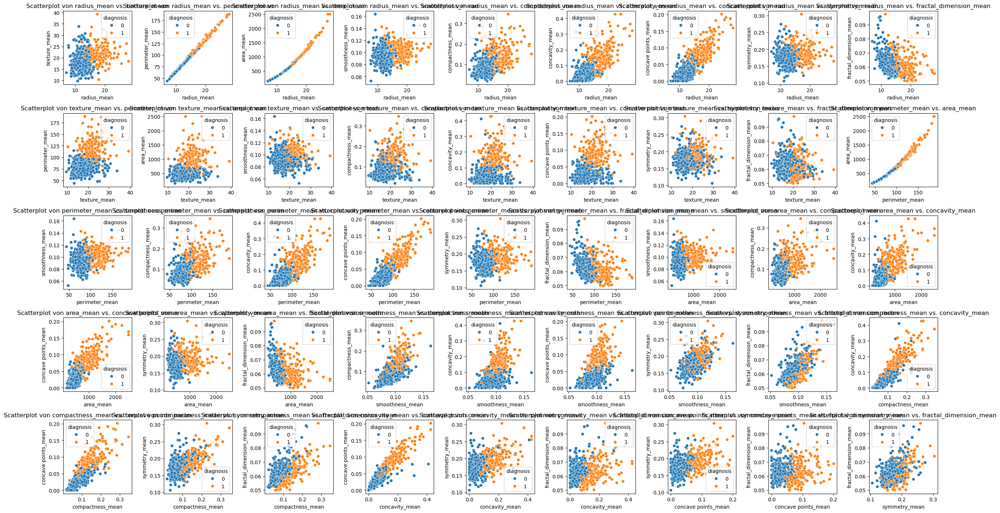

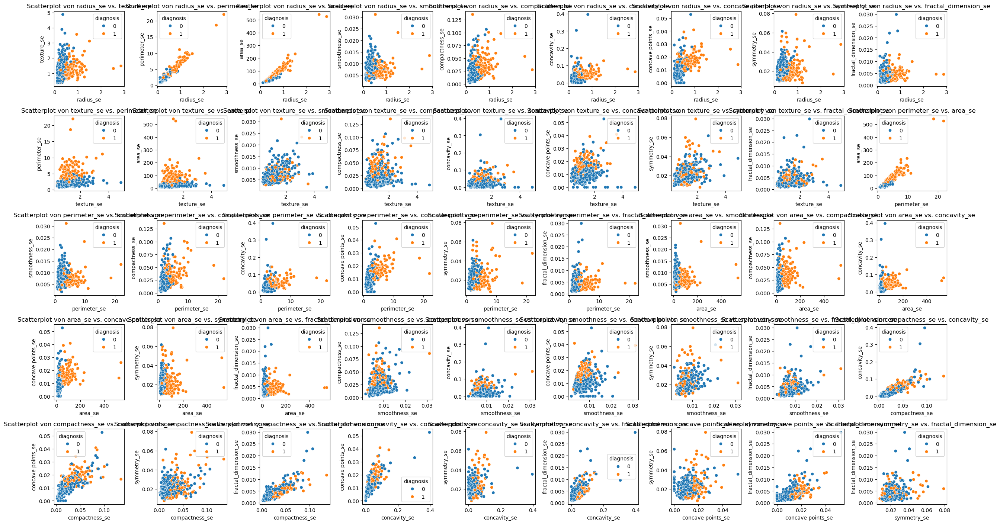

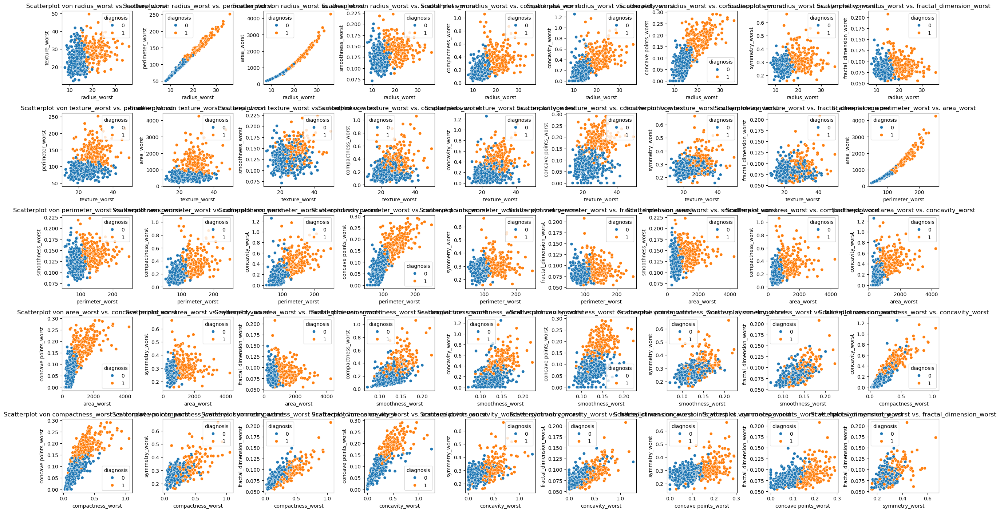

In [21]:
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 
            'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 
            'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 
            'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 
            'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 
            'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']

# number of eatures
n_features = len(features)

plots_per_page = 10  # number of Scatterplots per page

for start in range(0, n_features, plots_per_page):
    end = min(start + plots_per_page, n_features)
    plt.figure(figsize=(25, 25))
    plot_number = 1
    for i in range(start, end):
        for j in range(i + 1, end):
            plt.subplot(plots_per_page - 1, plots_per_page - 1, plot_number)
            sns.scatterplot(x=features[i], y=features[j], hue='diagnosis', data=df_clean)
            plt.title(f'Scatterplot von {features[i]} vs. {features[j]}')
            plt.xlabel(features[i])
            plt.ylabel(features[j])
            plot_number += 1
    plt.tight_layout()
    plt.show()

### Violinplots

Width of the Violin:
A wide violin in a certain area indicates a high density of data points, while a narrow violin indicates a low density.

Shape of the Violin:
A violin with multiple peaks may suggest different subgroups within the diagnosis category.

Differences Between Groups:
If the violin plots for benign and malignant groups show significantly different shapes, the feature may be useful for classification.

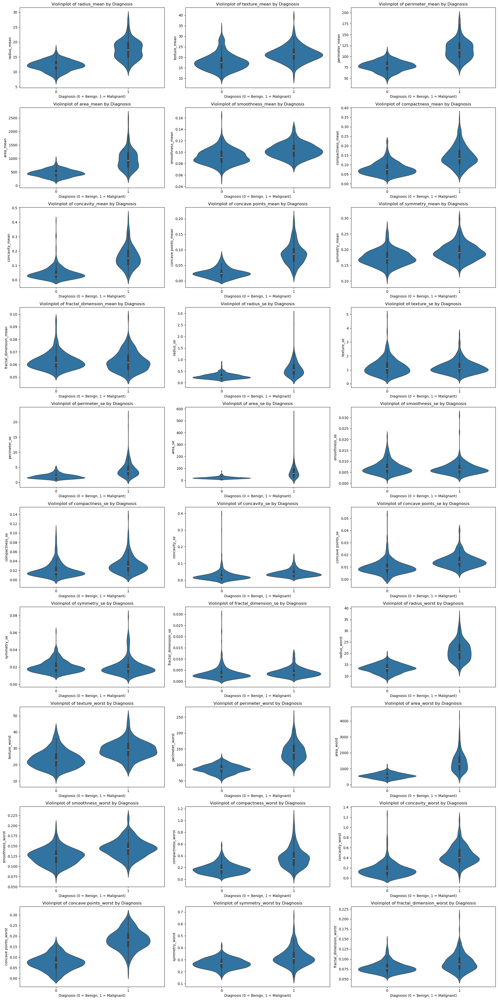

In [22]:
features = ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 
            'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 
            'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 
            'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 
            'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 
            'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']

plt.figure(figsize=(20, 40))  # Adjust figure size for all plots
for i, feature in enumerate(features):
    plt.subplot(10, 3, i+1)  # 10x3 grid layout for the subplots
    sns.violinplot(x='diagnosis', y=feature, data=df_clean)
    plt.title(f'Violinplot of {feature} by Diagnosis')  # Plot title
    plt.xlabel('Diagnosis (0 = Benign, 1 = Malignant)')  # X-axis label
    plt.ylabel(feature)  # Y-axis label
plt.tight_layout()
plt.show()

### Correlation Matrix
This list shows the features that are most strongly correlated with the diagnosis, which is helpful for understanding 
which features are most relevant for the diagnosis.

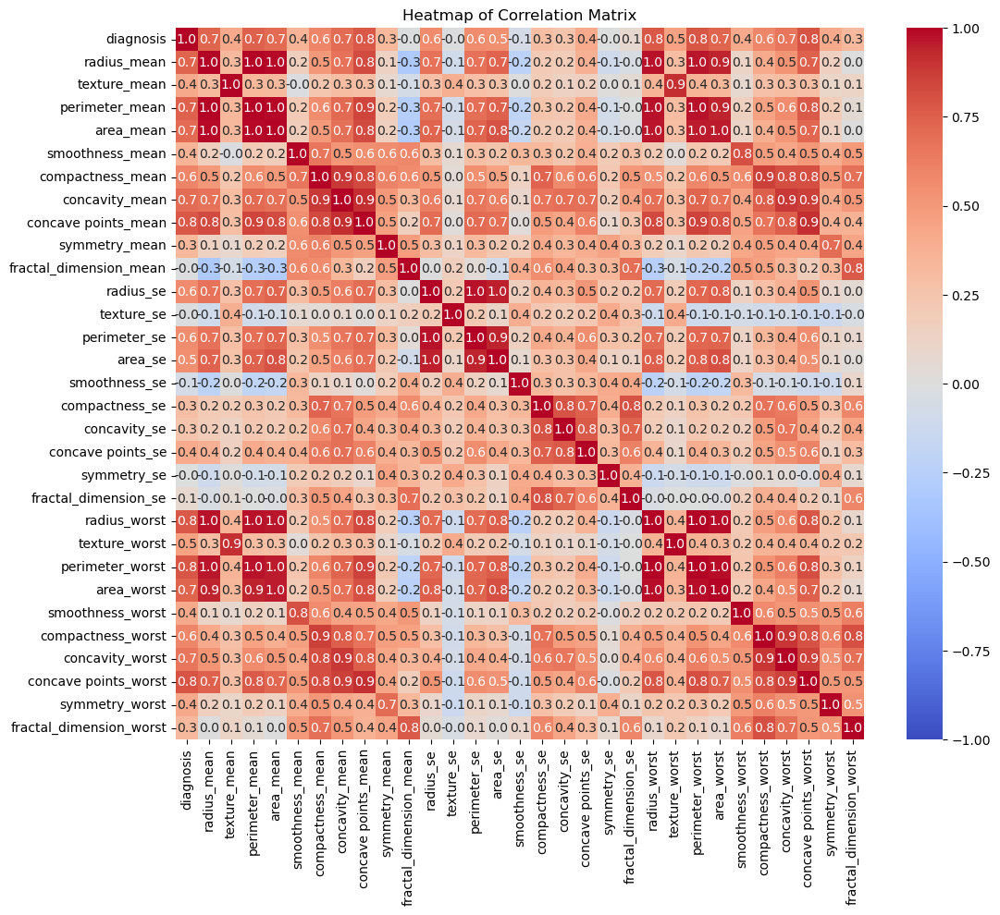


Strongest Correlations with Diagnosis:
diagnosis                  1.000000
concave points_worst       0.793566
perimeter_worst            0.782914
concave points_mean        0.776614
radius_worst               0.776454
perimeter_mean             0.742636
area_worst                 0.733825
radius_mean                0.730029
area_mean                  0.708984
concavity_mean             0.696360
concavity_worst            0.659610
compactness_mean           0.596534
compactness_worst          0.590998
radius_se                  0.567134
perimeter_se               0.556141
area_se                    0.548236
texture_worst              0.456903
smoothness_worst           0.421465
symmetry_worst             0.416294
texture_mean               0.415185
concave points_se          0.408042
smoothness_mean            0.358560
symmetry_mean              0.330499
fractal_dimension_worst    0.323872
compactness_se             0.292999
concavity_se               0.253730
fractal_dimension_se    

In [23]:
# Correlation Matrix of Features
corr_matrix = df_clean.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".1f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap of Correlation Matrix')  # Plot title
plt.show()
# Meaning: The heatmap of the correlation matrix shows the correlations between all numerical features. Strong correlations can indicate relationships between features.

# List the strongest correlations with the diagnosis
corr_with_diagnosis = corr_matrix['diagnosis'].abs().sort_values(ascending=False)
print("\nStrongest Correlations with Diagnosis:")
print(corr_with_diagnosis)

## Data Analysis <a id='dataanal'></a>

### Outliers
Outliers are deviant values in a dataset that can arise from various causes and 
may affect the accuracy of analyses and models.

### Function to Identify Outliers Based on the Interquartile Range (IQR)
The function `find_outliers` detects outliers in a dataset by calculating the Interquartile Range (IQR) for each feature. It then identifies values that fall below the lower bound or above the upper bound as outliers.

### Display Outliers
The identified outliers are shown using the function `find_outliers`, which lists the features and the respective outlier values.

In [24]:
# Function to identify outliers based on the Interquartile Range (IQR)
def find_outliers(df_cleaned):
    outliers = pd.DataFrame()

    for column in df_clean.columns:
        Q1 = df_clean[column].quantile(0.25)
        Q3 = df_clean[column].quantile(0.75)
        IQR = Q3 - Q1

        # Definition of lower and upper bounds for normal values
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Identification of outliers
        outlier_condition = (df_clean[column] < lower_bound) | (df_clean[column] > upper_bound)
        outliers_in_column = df_clean[column][outlier_condition]
        if not outliers_in_column.empty:
            outliers[column] = outliers_in_column

    return outliers

# Display outliers
outliers = find_outliers(df_clean)
print("\nIdentified outliers:")
print(outliers)



Identified outliers:
     radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
82         25.22           NaN           171.5     1878.0              NaN   
108        22.27           NaN           152.8     1509.0              NaN   
122        24.25           NaN           166.2     1761.0           0.1447   
164        23.27           NaN           152.1     1686.0              NaN   
180        27.22           NaN           182.1     2250.0              NaN   
202        23.29           NaN           158.9     1685.0              NaN   
212        28.11           NaN           188.5     2499.0              NaN   
236        23.21           NaN           153.5     1670.0              NaN   
339        23.51           NaN           155.1     1747.0              NaN   
352        25.73           NaN           174.2     2010.0              NaN   
369        22.01           NaN             NaN     1482.0              NaN   
461        27.42           NaN           1

### Heatmap with Correlation Above 0.5
The new heatmap of the correlation matrix shows the correlations of the remaining features after removing features with low correlation to the diagnosis.


Remaining features after removing features with correlation < 0.5:
Index(['diagnosis', 'radius_mean', 'perimeter_mean', 'area_mean',
       'compactness_mean', 'concavity_mean', 'concave points_mean',
       'radius_se', 'perimeter_se', 'area_se', 'radius_worst',
       'perimeter_worst', 'area_worst', 'compactness_worst', 'concavity_worst',
       'concave points_worst'],
      dtype='object')


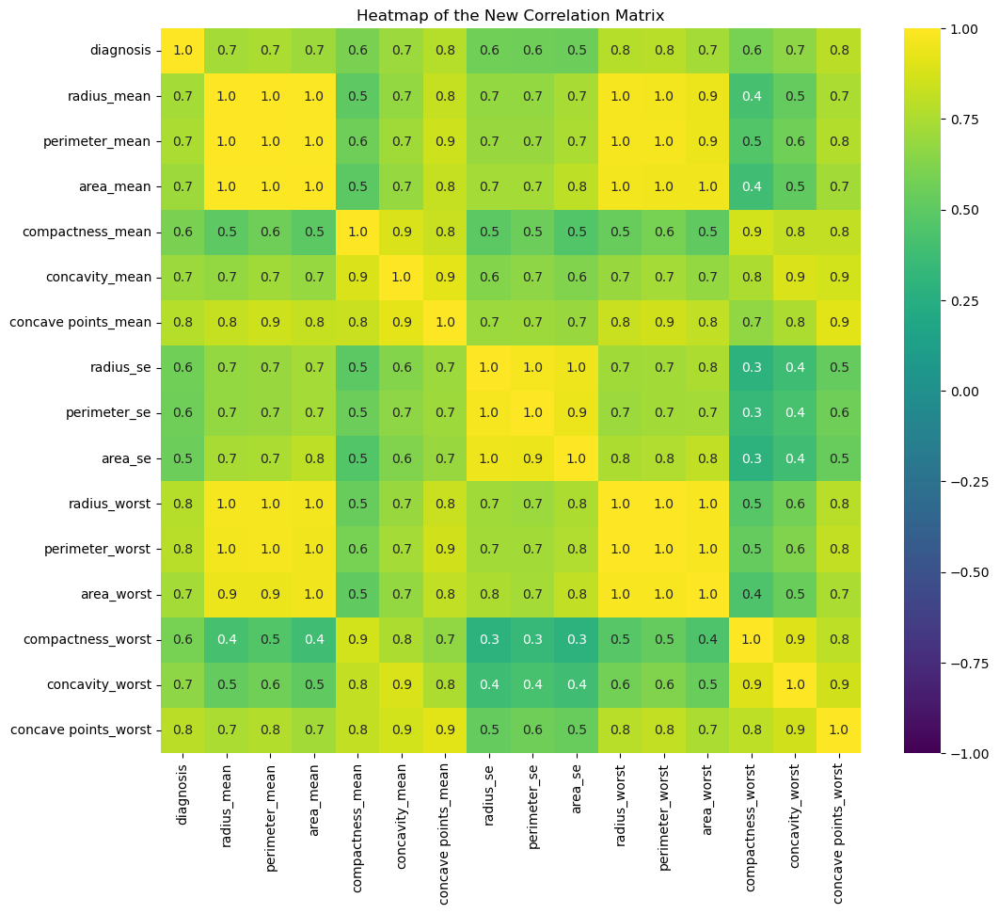

In [25]:
# Removing features with low correlation to the diagnosis
corr_matrix = df_clean.corr()
corr_with_diagnosis = corr_matrix['diagnosis']
low_corr_features = corr_with_diagnosis[abs(corr_with_diagnosis) < 0.5].index
df_cleaned = df_clean.drop(columns=low_corr_features)

print("\nRemaining features after removing features with correlation < 0.5:")
print(df_cleaned.columns)
# Meaning: Features with low correlation to the diagnosis are removed to reduce the number of features and simplify the analysis.

# New correlation matrix after removing features with low correlation
corr_matrix1 = df_cleaned.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix1, annot=True, fmt=".1f", cmap='viridis', vmin=-1, vmax=1)
plt.title('Heatmap of the New Correlation Matrix')  # Title of the plot
plt.show()

In [26]:
df_cleaned.shape

(569, 16)

In [27]:
df_cleaned.columns

Index(['diagnosis', 'radius_mean', 'perimeter_mean', 'area_mean',
       'compactness_mean', 'concavity_mean', 'concave points_mean',
       'radius_se', 'perimeter_se', 'area_se', 'radius_worst',
       'perimeter_worst', 'area_worst', 'compactness_worst', 'concavity_worst',
       'concave points_worst'],
      dtype='object')

In [28]:
# save for later
df_cleaned.to_csv("cancer_cleaned.csv",index=False)

In [29]:
df_for_ml = df_cleaned.copy()

### Principal Component Analysis (PCA)
The PCA results show the feature weights in the principal components and the percentage of explained variance. This information helps to understand which features contribute most to the variation in the data.

In [30]:
# Conducting Principal Component Analysis (PCA)
pca = PCA(n_components=2)  # PCA with 2 principal components
X = df_cleaned.drop('diagnosis', axis=1)  # Features (excluding target variable)
y = df_cleaned['diagnosis']  # Target variable
X_scaled = StandardScaler().fit_transform(X)  # Scaling the features
X_pca = pca.fit_transform(X_scaled)  # Performing PCA

# Displaying PCA results
print("\nPrincipal Components (PCs):")
print("PC1:", pca.components_[0])  # Weights of the first principal component
print("PC2:", pca.components_[1])  # Weights of the second principal component

print("\nExplained Variance:")
print(f"PC1: {pca.explained_variance_ratio_[0]*100:.1f}%")  # Percentage of explained variance by PC1
print(f"PC2: {pca.explained_variance_ratio_[1]*100:.1f}%")  # Percentage of explained variance by PC2


Principal Components (PCs):
PC1: [0.27449937 0.28029117 0.27690309 0.22539035 0.26185039 0.28261669
 0.23866506 0.24149952 0.24477732 0.28083992 0.28643488 0.27808144
 0.19389981 0.22146697 0.26473382]
PC2: [-0.16844411 -0.13782731 -0.19880351  0.37894185  0.25063944  0.1142985
 -0.2417599  -0.19974152 -0.27223639 -0.14271651 -0.10446722 -0.17833351
  0.47730313  0.41278669  0.24469088]

Explained Variance:
PC1: 74.3%
PC2: 14.1%


### Bar Plot
A bar plot is used to visually compare different categories based on their numerical values, 
making it easy to spot trends, differences, and rankings among the categories.

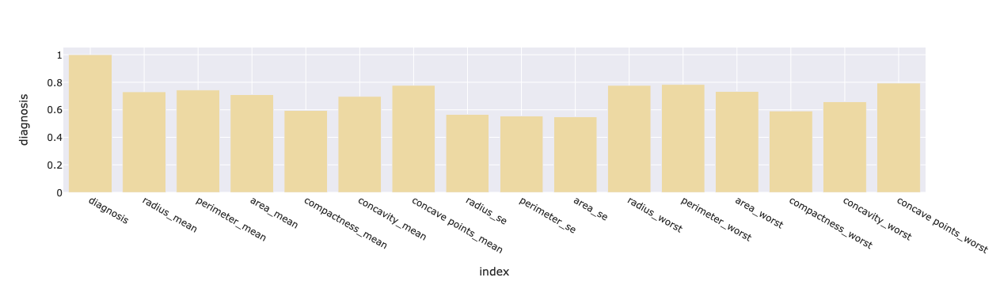

In [31]:
diag_df = corr_matrix1.reset_index()

px.bar(diag_df,x='index',y='diagnosis',color_discrete_sequence=px.colors.sequential.Agsunset_r,template = 'seaborn')

### K-Means-Clustering with PCA

K-Means partitions the data into k clusters, defined by their centroids. The method aims to group the data so that distances between points within a cluster are minimized and distances between clusters are maximized.

The visualization shows how the data points are divided into clusters. By visualizing the clusters, one can see if there are clearly defined groups and how these groups are spatially distributed.

In a medical context, this might indicate whether there are clear differences between benign and malignant tumors if the clusters reflect the diagnostic categories.

Can be useful for detecting cluster centers and sizes.

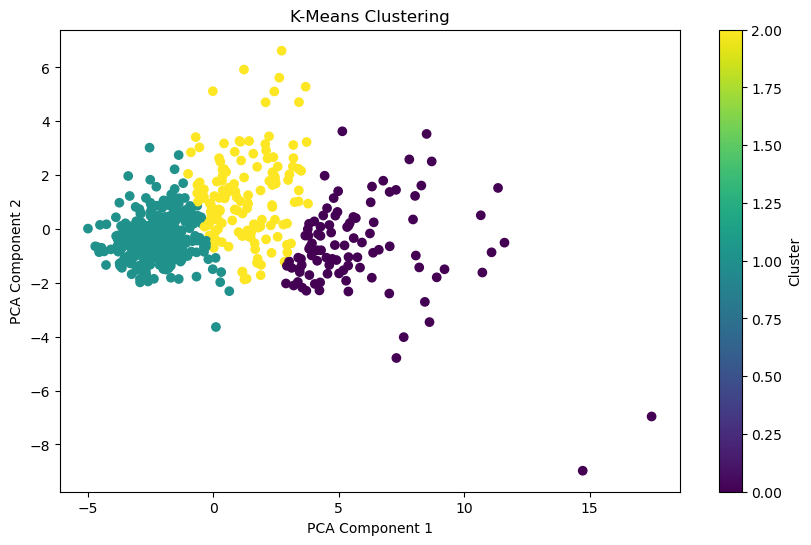

In [32]:

# Data Preparation
# Removing the target variable 'diagnosis' for clustering
X = df_cleaned.drop('diagnosis', axis=1)

# Scaling the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Performing K-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # Specify the number of clusters
clusters = kmeans.fit_predict(X_scaled)

# Adding the cluster membership to the DataFrame
df_cleaned['Cluster'] = clusters

# Visualization of Clusters
# PCA to reduce to 2 dimensions for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis', label='Cluster')
plt.title('K-Means Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='Cluster')
plt.show()

### Density-Based Spatial Clustering of Applications with Noise (DBSCAN) with PCA

DBSCAN clusters data points based on their density. Points that are close to each other are assigned to the same cluster, while points in lower density areas are treated as noise. This is useful for identifying clusters of arbitrary shape and detecting outliers.

The visualization shows how DBSCAN has grouped the data. Unlike K-Means, clusters can take on any shape, and DBSCAN may also identify some points as noise that do not fit into any cluster. This can be helpful for identifying outliers or unusual patterns in the data.

Uses density-based clustering.
No need to specify the number of clusters in advance.
Better suited for clusters of arbitrary shape and for detecting outliers.
Useful when the data is irregularly distributed and you do not know how many clusters there are.

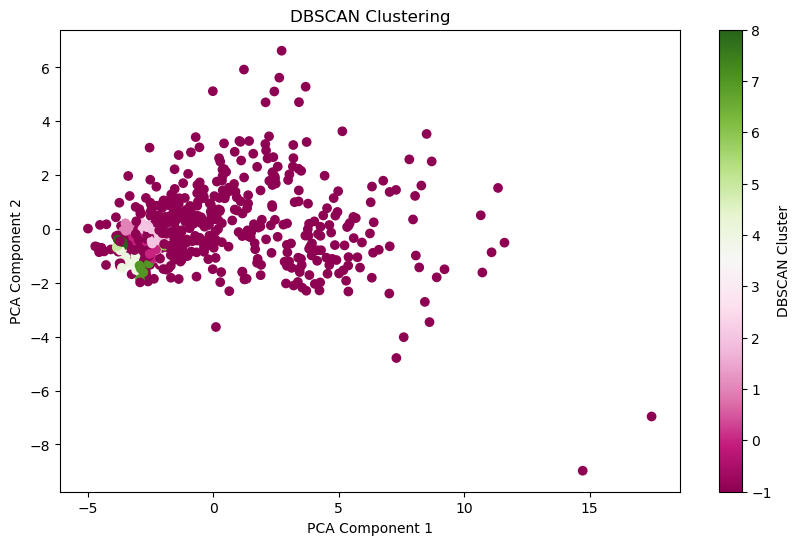

In [33]:
# Performing DBSCAN Clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)  # eps: Maximum distance for the clusters, min_samples: Minimum number of points for a cluster
dbscan_clusters = dbscan.fit_predict(X_scaled)

# Adding the cluster membership to the DataFrame
df_cleaned['DBSCAN_Cluster'] = dbscan_clusters

# Visualizing the DBSCAN Clusters
# PCA for reduction to 2 dimensions for visualization
X_pca_dbscan = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
plt.scatter(X_pca_dbscan[:, 0], X_pca_dbscan[:, 1], c=dbscan_clusters, cmap='PiYG', label='DBSCAN Cluster')
plt.title('DBSCAN Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(label='DBSCAN Cluster')
plt.show()

### Hierarchical Clustering Dendrogram
The dendrogram provides a visual representation that makes it easier to understand complex data relationships and to make decisions about the number of clusters. It helps to recognize the structure of the data and understand which objects have similar characteristics.

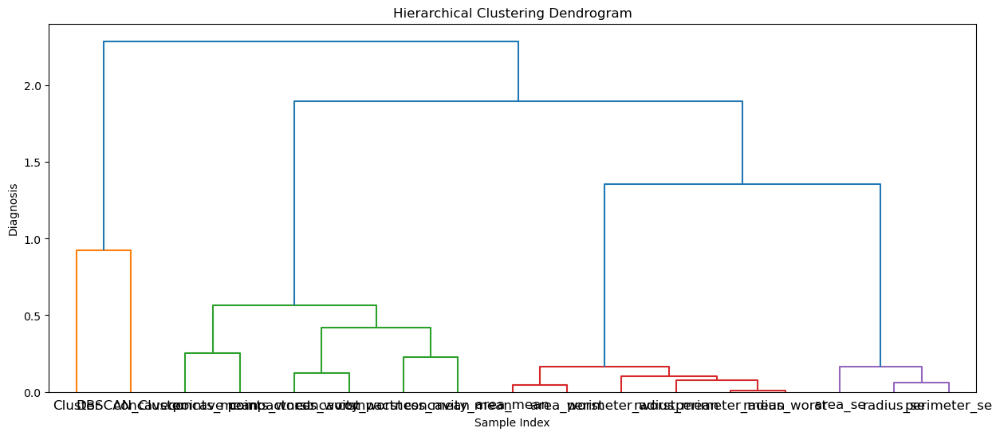

In [34]:
pca_vars = df_cleaned.drop(columns=['diagnosis'])

# Standardize
X_std = StandardScaler().fit_transform(pca_vars)

# PCA
pca = PCA(n_components='mle', svd_solver='full')
pca_result = pca.fit_transform(X_std)

# PCA DataFrame 
PCs_df = pd.DataFrame(
    pca_result,
    columns=['PC{}'.format(i) for i in range(1, pca_result.shape[1] + 1)]
    )

# Correlationsmatrix
df_dent = pd.DataFrame(index=pca_vars.columns, columns=PCs_df.columns)

for i, element in enumerate(pca_vars.columns):
    for j, pc in enumerate(PCs_df.columns):
            df_dent.iloc[i, j] = round(PCs_df[pc].corr(pca_vars[element]), 2)

# in float64
df_dent = df_dent.astype('float64')

# Hierarchical Clustering
Z = hierarchy.linkage(df_dent.iloc[:, :3], method='ward')

# Dendrogram
plt.figure(figsize=(15, 6))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Diagnosis')

# Dendrogram plot
hierarchy.dendrogram(
    Z,
    labels=df_dent.index,
    color_threshold=1  # Setze einen Schwellenwert, um die Cluster sichtbar zu machen
    )

plt.show()

### Scree Plot
The Scree Plot helps determine the optimal number of components or factors by showing which components are significant and which are not. It is a useful visual tool for reducing the dimensionality of the data to a manageable number of principal components or factors.

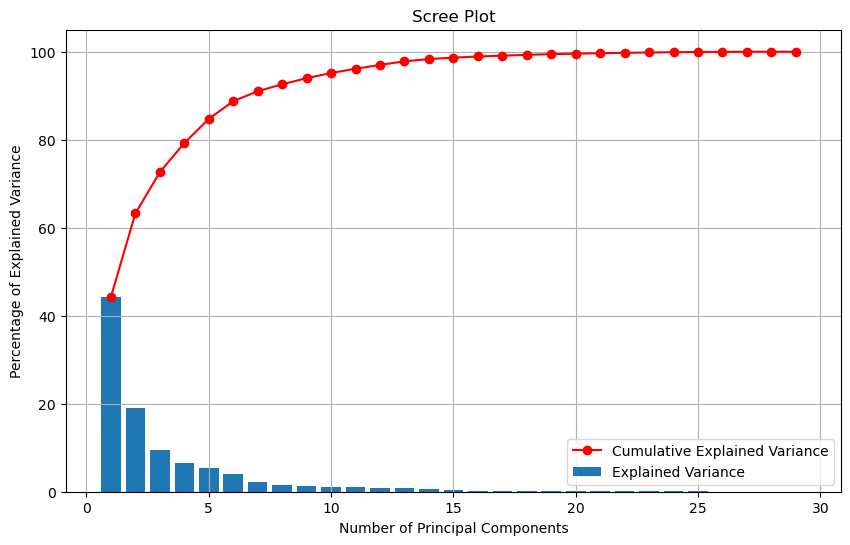

In [35]:
# Function to display the Scree Plot
def display_scree_plot(pca):
    # Calculate the explained variance as a percentage
    scree = pca.explained_variance_ratio_ * 100
    
    # Create the Scree Plot
    plt.figure(figsize=(10, 6))
    plt.bar(np.arange(len(scree)) + 1, scree, label='Explained Variance')
    plt.plot(np.arange(len(scree)) + 1, scree.cumsum(), color='red', marker='o', label='Cumulative Explained Variance')
    plt.xlabel("Number of Principal Components")
    plt.ylabel("Percentage of Explained Variance")
    plt.title("Scree Plot")
    plt.legend()
    plt.grid(True)
    plt.show(block=False)

# Drop the target variable 'diagnosis' from the dataset to prepare data for PCA
pca_vars = df_clean.drop(columns=['diagnosis'])

# Standardize the data (mean=0, variance=1) before applying PCA
X_std = StandardScaler().fit_transform(pca_vars)

# Perform PCA
# 'mle' is used for automatic selection of the number of components with the 'full' SVD solver
pca = PCA(n_components='mle', svd_solver='full')
pca.fit(X_std)

# Display the Scree Plot
display_scree_plot(pca)

# Machine Learning <a id='ml'></a>

## Data 

In [36]:
df_for_ml.head()

,diagnosis,radius_mean,perimeter_mean,area_mean,compactness_mean,concavity_mean,concave points_mean,radius_se,perimeter_se,area_se,radius_worst,perimeter_worst,area_worst,compactness_worst,concavity_worst,concave points_worst
0,1,17.99,122.80,1001.0,0.27760,0.3001,0.14710,1.0950,8.589,153.40,25.38,184.60,2019.0,0.6656,0.7119,0.2654
1,1,20.57,132.90,1326.0,0.07864,0.0869,0.07017,0.5435,3.398,74.08,24.99,158.80,1956.0,0.1866,0.2416,0.1860
2,1,19.69,130.00,1203.0,0.15990,0.1974,0.12790,0.7456,4.585,94.03,23.57,152.50,1709.0,0.4245,0.4504,0.2430
3,1,11.42,77.58,386.1,0.28390,0.2414,0.10520,0.4956,3.445,27.23,14.91,98.87,567.7,0.8663,0.6869,0.2575
4,1,20.29,135.10,1297.0,0.13280,0.1980,0.10430,0.7572,5.438,94.44,22.54,152.20,1575.0,0.2050,0.4000,0.1625


In [37]:
X = df_for_ml.drop(['diagnosis'],axis = 1 )
y = df_for_ml['diagnosis']

### Validation Functions

In [38]:
def cr_validate(y_test, y_pred, y_pred_proba):
    
    tn, fp, fn, tp = confusion_matrix(y_train, y_pred).ravel()

    # calculations
    accuracy = accuracy_score(y_train, y_pred)
    specificity = tn / (tn + fp)
    sensitivity = recall_score(y_train, y_pred)
    precision = precision_score(y_train, y_pred)
    f1 = f1_score(y_train, y_pred)
    roc_auc = roc_auc_score(y_train, y_pred_proba)

    # output metrics
    print(f"Specificity: {specificity:.4f}")
    print(f"Sensitivity (Recall): {sensitivity:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"F1-Score: {f1:.4f}")
    print(f"ROC AUC: {roc_auc:.4f}")

    # ROC curve
    fpr, tpr, _ = roc_curve(y_train, y_pred_proba)

    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    plt.figure(figsize=(6,4))
    sns.heatmap(confusion_matrix(y_train, y_pred), annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

In [39]:
def validate_model(y_test, y_pred, y_pred_proba):
    
    # Calculate confusion matrix components
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    
    # Calculate metrics
    specificity = tn / (tn + fp)
    sensitivity = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    
    print(f"Specificity: {specificity:.4f}")
    print(f"Sensitivity (Recall): {sensitivity:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"F1-Score: {f1:.4f}")
    print(f"ROC AUC: {roc_auc:.4f}")
   
    return specificity, sensitivity, precision, accuracy, f1, roc_auc

## Random Forest <a id='randomforest'></a>

Hyperparameter search:

warnings.filterwarnings('ignore')
forest_params_gridsearch = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'max_features': ['auto', 'sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 42)

rfc_for_gridsearch = RandomForestClassifier()
clf = GridSearchCV(rfc_for_gridsearch, forest_params_gridsearch, cv = 10, scoring='accuracy')
clf.fit(X_train, y_train)

print(clf.best_params_)
print(clf.best_score_)

{'criterion': 'entropy', 'max_depth': 15, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
0.9582125603864735

### Random Forest Validation

Specificity: 0.9544
Sensitivity (Recall): 0.9294
Precision: 0.9240
Accuracy: 0.9451
F1-Score: 0.9267
ROC AUC: 0.9815


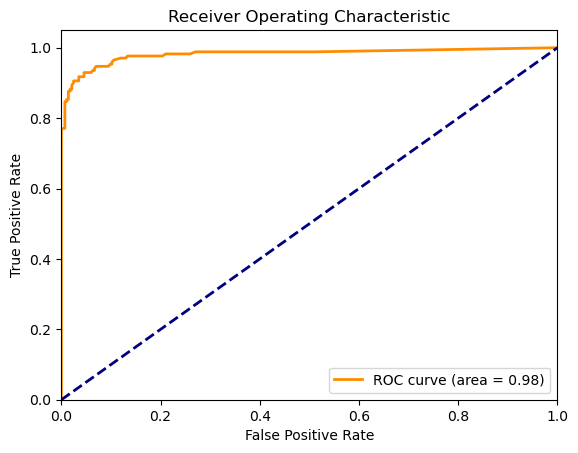

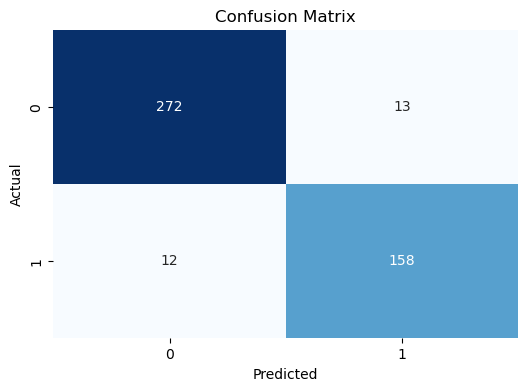

In [41]:
########################## DEFINE HYPERPARAMETERS HERE #################################################

criterion = 'entropy'
n_estimators = 100
max_depth = 15
min_samples_split = 2
min_samples_leaf = 1
max_features = 'sqrt'

########################################################################################################

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('rf', RandomForestClassifier(
    n_estimators=n_estimators,
    max_depth=max_depth,
    min_samples_split=min_samples_split,
    min_samples_leaf=min_samples_leaf,
    max_features=max_features,
    random_state=42))
])

cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
y_pred = cross_val_predict(pipeline, X_train, y_train, cv=cv, method='predict')
y_pred_proba = cross_val_predict(pipeline, X_train, y_train, cv=cv, method='predict_proba')[:, 1]

cr_validate(y_train, y_pred, y_pred_proba)

## Neural Network <a id='network'></a>

Hyperparameter search:


def create_model(n_layers=3, n_neurons=100, activation='relu', learning_rate=0.001, dropout_rate=0.1, optimizer='adam'):
    model = Sequential()
    model.add(Input(shape=(n_cols,)))  # Define the input layer with the correct input shape
    model.add(Dense(n_neurons, activation=activation))
    
    for _ in range(n_layers - 1):
        model.add(Dense(n_neurons, activation=activation))
        model.add(Dropout(dropout_rate))
    
    model.add(Dense(1, activation='sigmoid'))
    
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'sgd':
        opt = SGD(learning_rate=learning_rate)
    else:
        raise ValueError("Unsupported optimizer: {}".format(optimizer))
    
    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    return model


model = KerasClassifier(model=create_model, verbose=0)


param_grid = {
    'model__n_layers': [2, 3, 4],
    'model__n_neurons': [100, 150, 200],
    'model__activation': ['relu', 'sigmoid'],
    'model__learning_rate': [0.001, 0.002],
    'model__dropout_rate': [0.1, 0.2],
    'model__optimizer': ['adam', 'sgd'],
    'batch_size': [8, 16]
}


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
n_cols = X_train.shape[1]  # Define the number of features


grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=5)
grid_result = grid.fit(X_train, y_train)


print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.881319 using {'batch_size': 16, 'model__activation': 'sigmoid', 'model__dropout_rate': 0.2, 'model__learning_rate': 0.001, 'model__n_layers': 2, 'model__n_neurons': 200, 'model__optimizer': 'adam'}

### Neural Network Validation

In [42]:
# NEURAL NETWORK CROSS VALIDATION WITH SMOTE
########################## DEFINE HYPERPARAMETERS HERE #################################################

n_layers = 2 
n_neurons = 200 
activation = 'sigmoid'  
learning_rate = 0.001  
dropout_rate = 0.2  
optimizer_choice = 'adam'  
batch_size = 16

########################################################################################################

skf = StratifiedKFold(n_splits=10)
sq_for_cv_rocs = []
sq_for_cv_sensitivities = []
sq_for_cv_specificities = []
sq_for_cv_precisions = []
sq_for_cv_accuracies = []
sq_for_cv_fmeasures = []

smote = SMOTE(random_state=42)

for train_index, test_index in skf.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Apply SMOTE to the training data
    X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
    
    n_cols = X.shape[1]
    sq_for_cv = Sequential()
    sq_for_cv.add(Dense(n_neurons, activation=activation, input_shape=(n_cols,)))
    for i in range(n_layers - 1):
        sq_for_cv.add(Dense(n_neurons, activation=activation))
        sq_for_cv.add(Dropout(dropout_rate))
    sq_for_cv.add(Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

    if optimizer_choice == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'sgd':
        optimizer = SGD(learning_rate=learning_rate)
    
    sq_for_cv.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    sq_for_cv.fit(X_train_smote, y_train_smote, epochs=50, batch_size=batch_size, verbose=1)

    predicted_proba = sq_for_cv.predict(X_test)
    predicted = np.round(predicted_proba)

    tn, fp, fn, tp = confusion_matrix(y_test, predicted).ravel()
    tn = float(tn)
    fp = float(fp)
    fn = float(fn)
    tp = float(tp)

    roc = roc_auc_score(y_test, predicted_proba)
    sensitivity = float(tp / (tp + fn))
    specificity = float(tn / (tn + fp))
    precision = float(tp / (tp + fp))
    accuracy = float((tp + tn) / (tp + tn + fn + fp))
    fmeasure = float(2 * precision * sensitivity) / (precision + sensitivity)

    sq_for_cv_rocs.append(roc)
    sq_for_cv_sensitivities.append(sensitivity)
    sq_for_cv_specificities.append(specificity)
    sq_for_cv_precisions.append(precision)
    sq_for_cv_accuracies.append(accuracy)
    sq_for_cv_fmeasures.append(fmeasure)

mean_roc = sum(sq_for_cv_rocs) / 10
mean_sensitivity = sum(sq_for_cv_sensitivities) / 10
mean_specificity = sum(sq_for_cv_specificities) / 10
mean_precision = sum(sq_for_cv_precisions) / 10
mean_accuracy = sum(sq_for_cv_accuracies) / 10
mean_fmeasure = sum(sq_for_cv_fmeasures) / 10

print(f"Mean ROC: {mean_roc:.4f}")
print(f"Mean Sensitivity: {mean_sensitivity:.4f}")
print(f"Mean Specificity: {mean_specificity:.4f}")
print(f"Mean Precision: {mean_precision:.4f}")
print(f"Mean Accuracy: {mean_accuracy:.4f}")
print(f"Mean F-measure: {mean_fmeasure:.4f}")

cv_results = {
    'ROCs': sq_for_cv_rocs,
    'Sensitivities': sq_for_cv_sensitivities,
    'Specificities': sq_for_cv_specificities,
    'Precisions': sq_for_cv_precisions,
    'Accuracies': sq_for_cv_accuracies,
    'F-measures': sq_for_cv_fmeasures
}
df_cv_results = pd.DataFrame(cv_results)

print(df_cv_results)

Epoch 1/50


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

2024-08-14 19:30:31.665944: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 495us/step - accuracy: 0.6968 - loss: 0.6039 
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - accuracy: 0.8690 - loss: 0.3707
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - accuracy: 0.9050 - loss: 0.2766
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - accuracy: 0.8958 - loss: 0.2250
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - accuracy: 0.9100 - loss: 0.2250
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - accuracy: 0.8969 - loss: 0.2579
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - accuracy: 0.9248 - loss: 0.2105
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - accuracy: 0.8639 - loss: 0.2946
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - accuracy: 0.9078 - loss: 0.2218
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - accuracy: 0.9071 - loss: 0.2285
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 442us/step - accuracy: 0.8823 - loss: 0.2463
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - accurac

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step - accuracy: 0.5964 - loss: 0.6707 
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - accuracy: 0.9007 - loss: 0.3692
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 369us/step - accuracy: 0.8779 - loss: 0.3536
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - accuracy: 0.9249 - loss: 0.2330
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - accuracy: 0.8772 - loss: 0.2816
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 361us/step - accuracy: 0.9164 - loss: 0.1964
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 366us/step - accuracy: 0.8659 - loss: 0.2794
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - accuracy: 0.9052 - loss: 0.2533
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - accuracy: 0.9046 - loss: 0.2308
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 365us/step - accuracy: 0.9119 - loss: 0.2263
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - accuracy: 0.9079 - loss: 0.1911
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - accurac

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 442us/step - accuracy: 0.5477 - loss: 0.6741 
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - accuracy: 0.8852 - loss: 0.3544
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - accuracy: 0.8877 - loss: 0.2711
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 392us/step - accuracy: 0.9212 - loss: 0.2210
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - accuracy: 0.9094 - loss: 0.2218
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - accuracy: 0.9066 - loss: 0.2153
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - accuracy: 0.9122 - loss: 0.2091
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - accuracy: 0.9199 - loss: 0.1886
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 395us/step - accuracy: 0.9223 - loss: 0.2310
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - accuracy: 0.9004 - loss: 0.2326
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - accuracy: 0.8966 - loss: 0.2356
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 430us/step - accurac

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - accuracy: 0.6104 - loss: 0.6778 
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - accuracy: 0.8940 - loss: 0.3450
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 398us/step - accuracy: 0.8925 - loss: 0.2777
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - accuracy: 0.9146 - loss: 0.2300
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 410us/step - accuracy: 0.9059 - loss: 0.2566
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - accuracy: 0.9013 - loss: 0.2423
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 421us/step - accuracy: 0.9078 - loss: 0.2077
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 493us/step - accuracy: 0.8999 - loss: 0.2322
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 528us/step - accuracy: 0.9073 - loss: 0.2468
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 504us/step - accuracy: 0.9129 - loss: 0.2143
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 487us/step - accuracy: 0.9067 - loss: 0.2158
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 487us/step - accurac

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 419us/step - accuracy: 0.6190 - loss: 0.6488 
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - accuracy: 0.8862 - loss: 0.3367
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 383us/step - accuracy: 0.8724 - loss: 0.2865
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - accuracy: 0.8951 - loss: 0.2507
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 377us/step - accuracy: 0.8843 - loss: 0.2652
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 372us/step - accuracy: 0.9154 - loss: 0.2102
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 378us/step - accuracy: 0.8959 - loss: 0.2365
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - accuracy: 0.8976 - loss: 0.2268
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - accuracy: 0.8936 - loss: 0.2331
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - accuracy: 0.9058 - loss: 0.2437
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - accuracy: 0.8997 - loss: 0.2622
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - accurac

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 458us/step - accuracy: 0.6393 - loss: 0.6422 
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - accuracy: 0.8931 - loss: 0.3506
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 346us/step - accuracy: 0.9026 - loss: 0.2896
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - accuracy: 0.9058 - loss: 0.2412
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 350us/step - accuracy: 0.8882 - loss: 0.2568
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 352us/step - accuracy: 0.8985 - loss: 0.2482
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - accuracy: 0.9055 - loss: 0.2306
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 363us/step - accuracy: 0.9239 - loss: 0.2092
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step - accuracy: 0.9162 - loss: 0.2020
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - accuracy: 0.9179 - loss: 0.1894
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 388us/step - accuracy: 0.9121 - loss: 0.2231
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - accurac

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - accuracy: 0.6484 - loss: 0.6236 
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - accuracy: 0.8693 - loss: 0.3484
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 400us/step - accuracy: 0.8680 - loss: 0.3191
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - accuracy: 0.8733 - loss: 0.2865
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - accuracy: 0.8834 - loss: 0.2605
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 389us/step - accuracy: 0.8990 - loss: 0.2943
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 437us/step - accuracy: 0.9011 - loss: 0.2535
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - accuracy: 0.8893 - loss: 0.2177
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step - accuracy: 0.8847 - loss: 0.2614
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - accuracy: 0.9051 - loss: 0.2173
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - accuracy: 0.8891 - loss: 0.2491
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 379us/step - accurac

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - accuracy: 0.6411 - loss: 0.6340 
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - accuracy: 0.8843 - loss: 0.3496
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - accuracy: 0.8755 - loss: 0.2911
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - accuracy: 0.9082 - loss: 0.2387
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - accuracy: 0.9111 - loss: 0.2386
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 405us/step - accuracy: 0.9092 - loss: 0.2241
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - accuracy: 0.9031 - loss: 0.2319
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 386us/step - accuracy: 0.8974 - loss: 0.2277
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 382us/step - accuracy: 0.8986 - loss: 0.2276
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - accuracy: 0.9225 - loss: 0.2016
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 384us/step - accuracy: 0.9029 - loss: 0.2451
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step - accurac

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step - accuracy: 0.6011 - loss: 0.6836 
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - accuracy: 0.8769 - loss: 0.3522
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - accuracy: 0.9173 - loss: 0.2478
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - accuracy: 0.8875 - loss: 0.2822
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 403us/step - accuracy: 0.9237 - loss: 0.1949
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - accuracy: 0.9220 - loss: 0.2306
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - accuracy: 0.9155 - loss: 0.2009
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - accuracy: 0.9073 - loss: 0.2195
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - accuracy: 0.8917 - loss: 0.2138
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 390us/step - accuracy: 0.8795 - loss: 0.2923
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - accuracy: 0.9070 - loss: 0.2332
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - accurac

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step - accuracy: 0.5996 - loss: 0.6493 
Epoch 2/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - accuracy: 0.8795 - loss: 0.3340
Epoch 3/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 393us/step - accuracy: 0.9062 - loss: 0.2616
Epoch 4/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 380us/step - accuracy: 0.8856 - loss: 0.2621
Epoch 5/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - accuracy: 0.8958 - loss: 0.2245
Epoch 6/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 385us/step - accuracy: 0.9168 - loss: 0.2085
Epoch 7/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - accuracy: 0.9126 - loss: 0.2245
Epoch 8/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 381us/step - accuracy: 0.9103 - loss: 0.2146
Epoch 9/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - accuracy: 0.9117 - loss: 0.2183
Epoch 10/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 431us/step - accuracy: 0.9036 - loss: 0.2250
Epoch 11/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 414us/step - accuracy: 0.8860 - loss: 0.2368
Epoch 12/50
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 415us/step - accurac

## XGBoost <a id='xgboost'></a>

Hyperparameter tuning:

param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.3],
    'reg_alpha': [0, 0.01, 0.1],
    'reg_lambda': [1, 10, 100],
}

xg_reg = xgb.XGBClassifier()

clf = GridSearchCV(xg_reg, param_grid, cv=10, scoring='accuracy', verbose=1, n_jobs=-1)
clf.fit(X_train, y_train)

print(clf.best_params_)
print(clf.best_score_)

{'colsample_bytree': 0.8, 'gamma': 0.1, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'reg_alpha': 0, 'reg_lambda': 1, 'subsample': 0.9}
0.9604347826086957

### XGBoost Validation

Specificity: 0.9509
Sensitivity (Recall): 0.9353
Precision: 0.9191
Accuracy: 0.9451
F1-Score: 0.9271
ROC AUC: 0.9838


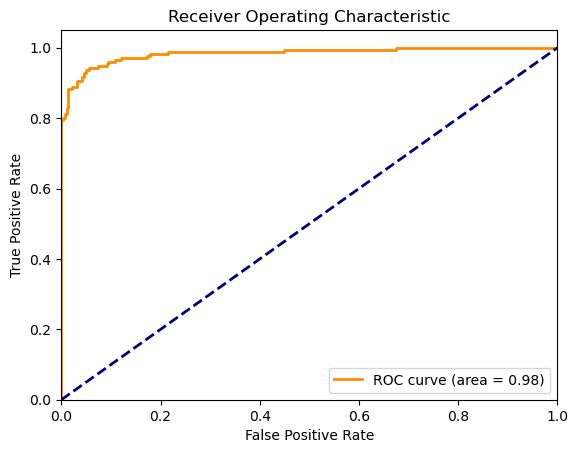

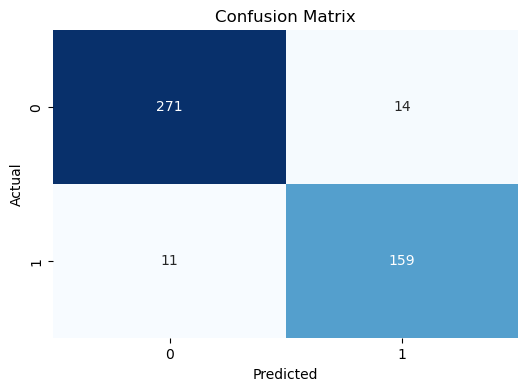

In [43]:
# XGBOOST CROSS VALIDATION 
########################## DEFINE HYPERPARAMETERS HERE #################################################

n_estimators = 100
colsample_bytree = 0.8
learning_rate = 0.05
max_depth = 5
min_child_weight = 3
subsample = 0.9
gamma = 0.1
reg_alpha = 0
reg_lambda = 1

########################################################################################################

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

xgb_classifier_cv = xgb.XGBClassifier(
    n_estimators=n_estimators,
    colsample_bytree=colsample_bytree,
    learning_rate=learning_rate,
    max_depth=max_depth,
    min_child_weight=min_child_weight,
    subsample=subsample,
    gamma=gamma,
    reg_alpha=reg_alpha,
    reg_lambda=reg_lambda,
    objective='binary:logistic',
    eval_metric='logloss'
)

pipeline = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('xgb', xgb_classifier_cv)
])

cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
y_pred = cross_val_predict(pipeline, X_train, y_train, cv=cv, method='predict')
y_pred_proba = cross_val_predict(pipeline, X_train, y_train, cv=cv, method='predict_proba')[:, 1]

cr_validate(y_test, y_pred, y_pred_proba)

## Explainability <a id='explain'></a>

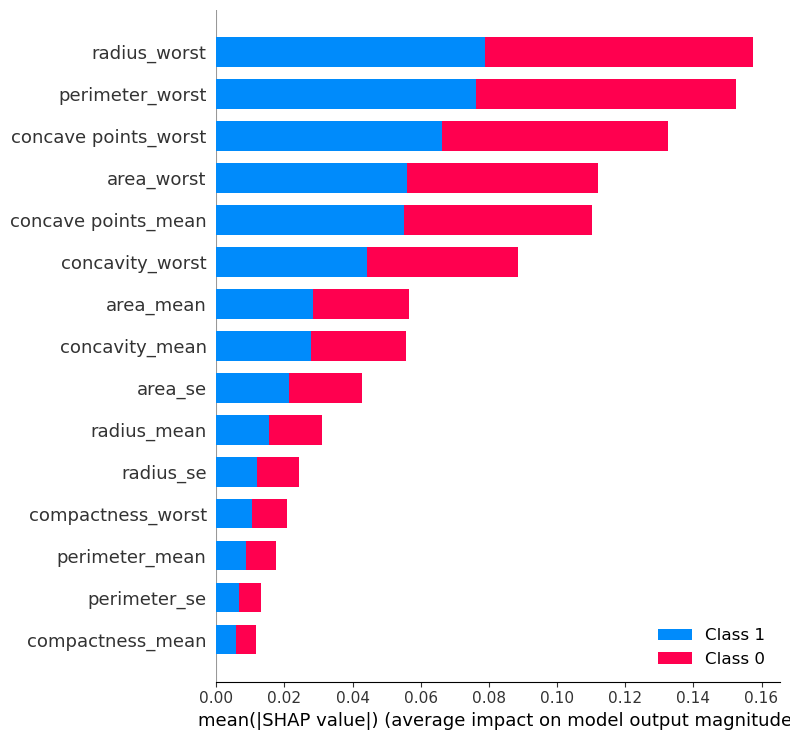

In [44]:
# Random Forest
########################## DEFINE HYPERPARAMETERS HERE #################################################

criterion = 'entropy'
n_estimators = 100
max_depth = 15
min_samples_split = 2
min_samples_leaf = 1
max_features = 'sqrt'

########################################################################################################

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

rf_for_shap = RandomForestClassifier(
    n_estimators=n_estimators,
    max_depth=max_depth,
    min_samples_split=min_samples_split,
    min_samples_leaf=min_samples_leaf,
    max_features=max_features,
    random_state=42
)

rf_for_shap.fit(X_train_smote, y_train_smote)

explainer = shap.TreeExplainer(rf_for_shap)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)

Epoch 1/50


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 367us/step - accuracy: 0.5311 - loss: 0.7034
Epoch 2/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - accuracy: 0.9006 - loss: 0.4253
Epoch 3/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step - accuracy: 0.8810 - loss: 0.3082
Epoch 4/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - accuracy: 0.9194 - loss: 0.2436
Epoch 5/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 417us/step - accuracy: 0.9199 - loss: 0.2090
Epoch 6/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - accuracy: 0.8833 - loss: 0.2622
Epoch 7/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - accuracy: 0.9173 - loss: 0.2097
Epoch 8/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 399us/step - accuracy: 0.8893 - loss: 0.2223
Epoch 9/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 409us/step - accuracy: 0.9046 - loss: 0.2346
Epoch 10/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - accuracy: 0.9018 - loss: 0.2184
Epoch 11/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 412us/step - accuracy: 0.8944 - loss: 0.2300
Epoch 12/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 371us/step - accuracy

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 183us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 190us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 218us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 191us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 189us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 192us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 189us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 184us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 192us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 191us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 195us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
6494/6494 ━━━━━━━━━━━━━━━━━━━━ 1s 191us/step
1/1 ━━

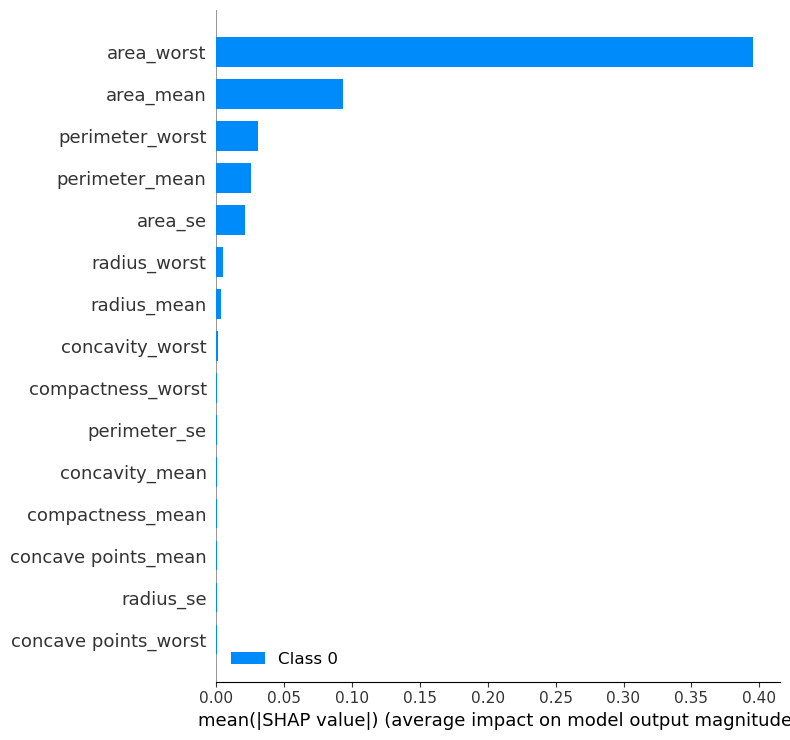

In [45]:
# Neural Network
########################## DEFINE HYPERPARAMETERS HERE #################################################

n_layers = 2 
n_neurons = 200 
activation = 'sigmoid'  
learning_rate = 0.001  
dropout_rate = 0.2  
optimizer_choice = 'adam'  
batch_size = 16 

########################################################################################################

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

n_cols = X.shape[1]

sq_for_shap = Sequential()
sq_for_shap.add(Dense(n_neurons, activation=activation, input_shape=(n_cols,)))
for i in range(n_layers - 1):
    sq_for_shap.add(Dense(n_neurons, activation=activation))
    sq_for_shap.add(Dropout(dropout_rate))
sq_for_shap.add(Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

if optimizer_choice == 'adam':
    optimizer = Adam(learning_rate=learning_rate)
elif optimizer_choice == 'sgd':
    optimizer = SGD(learning_rate=learning_rate)

sq_for_shap.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
sq_for_shap.fit(X_train_smote, y_train_smote, epochs=50, batch_size=batch_size, verbose=1)

explainer = shap.KernelExplainer(sq_for_shap.predict, X_train_smote[:100])  # Use a subset for background dataset
shap_values = explainer.shap_values(X_test[:100])  # Use a subset of the test set for efficiency
shap.summary_plot(shap_values, X_test[:100])


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

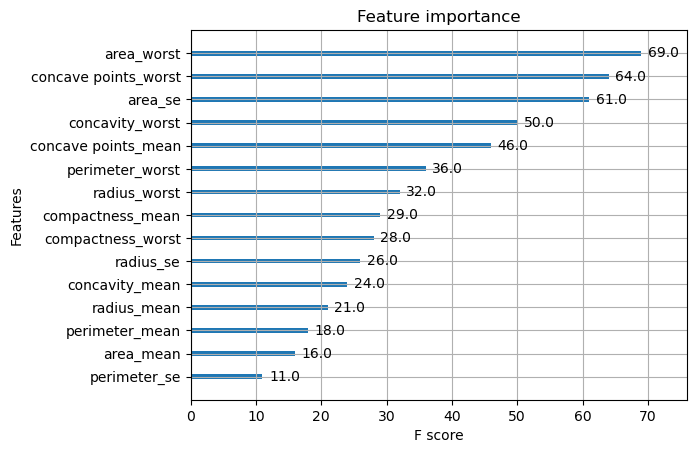

In [46]:
# XGBoost
########################## DEFINE HYPERPARAMETERS HERE #################################################

n_estimators = 100
colsample_bytree = 0.8
learning_rate = 0.05
max_depth = 5
min_child_weight = 3
subsample = 0.9
gamma = 0.1
reg_alpha = 0
reg_lambda = 1

########################################################################################################

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

xgb_for_xai = xgb.XGBClassifier(
    n_estimators=n_estimators,
    colsample_bytree=colsample_bytree,
    learning_rate=learning_rate,
    max_depth=max_depth,
    min_child_weight=min_child_weight,
    subsample=subsample,
    gamma=gamma,
    reg_alpha=reg_alpha,
    reg_lambda=reg_lambda,
    objective='binary:logistic',
    eval_metric='logloss'
)

xgb_for_xai.fit(X_train_smote, y_train_smote)

xgb.plot_importance(xgb_for_xai)

# Dashboard <a id='dashboard'></a>

## Dashboard basics <a id='basic_dash'></a>

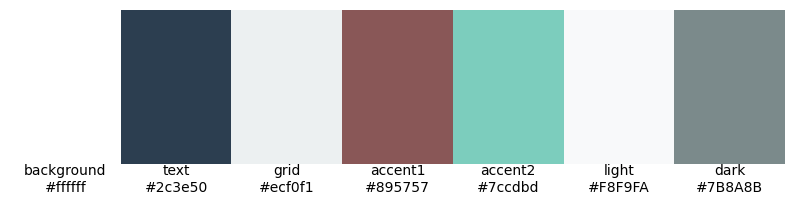

In [47]:
## Dash colors

# Flatly-inspirierte Farbpalette
flatly_colors = {
    'background': '#ffffff',
    'text': '#2c3e50',
    'grid': '#ecf0f1',
    'accent1': "#895757",#'#18bc9c',
    'accent2': "#7ccdbd",#'#3498db'
     'light': '#F8F9FA',
    'dark': '#7B8A8B'
}

# Erstellen Sie ein benutzerdefiniertes Theme basierend auf Flatly
pio.templates['flatly_custom'] = pio.templates['plotly_white']
pio.templates['flatly_custom'].layout.update(
    font_color=flatly_colors['text'],
    paper_bgcolor=flatly_colors['background'],
    plot_bgcolor=flatly_colors['background'],
    colorway=[flatly_colors['accent1'], flatly_colors['accent2']]
)

# Aktualisieren Sie die Achsen
pio.templates['flatly_custom'].layout.xaxis.update(gridcolor=flatly_colors['grid'])
pio.templates['flatly_custom'].layout.yaxis.update(gridcolor=flatly_colors['grid'])


def show_color_palette(color_dict):
    fig, ax = plt.subplots(figsize=(10, 2))
    ax.set_xlim(0, len(color_dict))
    ax.set_ylim(0, 1)
    ax.axis('off')

    for i, (name, color) in enumerate(color_dict.items()):
        rect = patches.Rectangle((i, 0), 1, 1, facecolor=color)
        ax.add_patch(rect)
        ax.text(i+0.5, -0.1, f'{name}\n{color}', ha='center', va='center')

    plt.show()

# Beispiel-Verwendung
flatly_colors = {
    'background': '#ffffff',
    'text': '#2c3e50',
    'grid': '#ecf0f1',
    'accent1': "#895757",
    'accent2': "#7ccdbd",
    'light': '#F8F9FA',
    'dark': '#7B8A8B'
}

show_color_palette(flatly_colors)

### Daten von Alena
X = df_for_ml.drop(['diagnosis'],axis = 1 )
y = df_for_ml['diagnosis']

In [48]:
### Daten von Elena
df_cleaned = pd.read_csv("cancer_cleaned.csv")
X = df_cleaned.drop(['diagnosis'],axis = 1 )
y = df_cleaned['diagnosis']
df_cleaned.head()

,diagnosis,radius_mean,perimeter_mean,area_mean,compactness_mean,concavity_mean,concave points_mean,radius_se,perimeter_se,area_se,radius_worst,perimeter_worst,area_worst,compactness_worst,concavity_worst,concave points_worst
0,1,17.99,122.80,1001.0,0.27760,0.3001,0.14710,1.0950,8.589,153.40,25.38,184.60,2019.0,0.6656,0.7119,0.2654
1,1,20.57,132.90,1326.0,0.07864,0.0869,0.07017,0.5435,3.398,74.08,24.99,158.80,1956.0,0.1866,0.2416,0.1860
2,1,19.69,130.00,1203.0,0.15990,0.1974,0.12790,0.7456,4.585,94.03,23.57,152.50,1709.0,0.4245,0.4504,0.2430
3,1,11.42,77.58,386.1,0.28390,0.2414,0.10520,0.4956,3.445,27.23,14.91,98.87,567.7,0.8663,0.6869,0.2575
4,1,20.29,135.10,1297.0,0.13280,0.1980,0.10430,0.7572,5.438,94.44,22.54,152.20,1575.0,0.2050,0.4000,0.1625


## ML Algorithms for the Dashboard <a id='ml_dash'></a>

### Function to pull out relevant metrics and plos for dashboard

In [49]:
# Function to pull out relevant metrics and plos for dashboard
#from sklearn.metrics import confusion_matrix, recall_score, precision_score, accuracy_score, f1_score, roc_auc_score, roc_curve


def validate_model(y_test, y_pred, y_pred_proba, flatly_colors):
    # Calculate confusion matrix components
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    
    # Calculate metrics
    specificity = tn / (tn + fp)
    sensitivity = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    
    # Set the style to a clean, modern look
    plt.style.use('default')
    
    # Create confusion matrix plot
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', 
                cmap=[flatly_colors['light'], flatly_colors['dark']], 
                cbar=False, ax=ax)
    ax.set_xlabel('Predicted', fontweight='bold')
    ax.set_ylabel('Actual', fontweight='bold')
    ax.set_title('Confusion Matrix', fontweight='bold')
    
    # Customize the plot to match Flatly style
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(colors=flatly_colors['text'])
    ax.xaxis.label.set_color(flatly_colors['text'])
    ax.yaxis.label.set_color(flatly_colors['text'])
    ax.title.set_color(flatly_colors['text'])
    
    # Save confusion matrix plot to a base64 string
    buffer = io.BytesIO()
    plt.savefig(buffer, format='png', bbox_inches='tight', facecolor=flatly_colors['background'])
    buffer.seek(0)
    confusion_matrix_plot = base64.b64encode(buffer.getvalue()).decode()
    plt.close()
    
    # Create ROC curve plot
    fig, ax = plt.subplots(figsize=(6, 4))
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    ax.plot(fpr, tpr, color=flatly_colors['accent1'], lw=2, 
            label=f'ROC curve (area = {roc_auc:.2f})')
    ax.plot([0, 1], [0, 1], color=flatly_colors['accent2'], lw=2, linestyle='--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate', fontweight='bold')
    ax.set_ylabel('True Positive Rate', fontweight='bold')
    ax.set_title('Receiver Operating Characteristic', fontweight='bold')
    ax.legend(loc="lower right")
    
    # Customize the plot to match Flatly style
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(colors=flatly_colors['text'])
    ax.xaxis.label.set_color(flatly_colors['text'])
    ax.yaxis.label.set_color(flatly_colors['text'])
    ax.title.set_color(flatly_colors['text'])
    ax.grid(color=flatly_colors['grid'], linestyle='--', alpha=0.7)
    
    # Save ROC curve plot to a base64 string
    buffer = io.BytesIO()
    plt.savefig(buffer, format='png', bbox_inches='tight', facecolor=flatly_colors['background'])
    buffer.seek(0)
    roc_curve_plot = base64.b64encode(buffer.getvalue()).decode()
    plt.close()
    
    # Return metrics and plot images
    return {
        'metrics': {
            'Specificity': specificity,
            'Sensitivity': sensitivity,
            'Precision': precision,
            'Accuracy': accuracy,
            'F1-Score': f1,
            'ROC AUC': roc_auc
        },
        'confusion_matrix_plot': confusion_matrix_plot,
        'roc_curve_plot': roc_curve_plot
    }


In [50]:
# XGBOOST
# Uses: X,y
# Output: xgb_classifier, specificity_xgb, sensitivity_xgb, precision_xgb, accuracy_xgb, f1_xgb, roc_auc_xgb,  confusion_matrix_plot, roc_curve_plot


########################## DEFINE HYPERPARAMETERS HERE #################################################

n_estimators = 100
colsample_bytree = 0.8
learning_rate = 0.05
max_depth = 5
min_child_weight = 3
subsample = 0.9
gamma = 0.1
reg_alpha = 0
reg_lambda = 1

########################################################################################################

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

xgb_classifier = xgb.XGBClassifier(
    n_estimators=n_estimators,
    colsample_bytree=colsample_bytree,
    learning_rate=learning_rate,
    max_depth=max_depth,
    min_child_weight=min_child_weight,
    subsample=subsample,
    gamma=gamma,
    reg_alpha=reg_alpha,
    reg_lambda=reg_lambda,
    objective='binary:logistic',
    eval_metric='logloss'
)

xgb_classifier.fit(X_train_smote, y_train_smote)

y_pred = xgb_classifier.predict(X_test)
y_pred_proba = xgb_classifier.predict_proba(X_test)[:, 1]

results_xgb = validate_model(y_test, y_pred, y_pred_proba, flatly_colors)

In [51]:
# RANDOM FOREST
# Uses: X,y
# Output: rf_classifier, specificity_rf, sensitivity_rf, precision_rf, accuracy_rf, f1_rf, roc_auc_rf,  confusion_matrix_plot, roc_curve_plot


########################## DEFINE HYPERPARAMETERS HERE #################################################

criterion = 'entropy'
n_estimators = 100
max_depth = 15
min_samples_split = 2
min_samples_leaf = 1
max_features = 'sqrt'

########################################################################################################

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

rf_classifier = RandomForestClassifier(
    n_estimators=n_estimators,
    max_depth=max_depth,
    min_samples_split=min_samples_split,
    min_samples_leaf=min_samples_leaf,
    max_features=max_features,
    random_state=42
)

rf_classifier.fit(X_train_smote, y_train_smote)

y_pred = rf_classifier.predict(X_test)
y_pred_proba = rf_classifier.predict_proba(X_test)[:, 1]

results_rf = validate_model(y_test, y_pred, y_pred_proba, flatly_colors)

In [52]:
# NEURAL NETWORK
# Uses: X,y
# Output: sq_model, specificity_sq, sensitivity_sq, precision_sq, accuracy_sq, f1_sq, roc_auc_sq,  confusion_matrix_plot, roc_curve_plot

########################## DEFINE HYPERPARAMETERS HERE #################################################

n_layers = 2 
n_neurons = 200 
activation = 'sigmoid'  
learning_rate = 0.001  
dropout_rate = 0.2  
optimizer_choice = 'adam'  
batch_size = 16 

########################################################################################################

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

n_cols = X.shape[1]

sq_model = Sequential()
sq_model.add(Dense(n_neurons, activation=activation, input_shape=(n_cols,)))
for i in range(n_layers - 1):
    sq_model.add(Dense(n_neurons, activation=activation))
    sq_model.add(Dropout(dropout_rate))
    sq_model.add(Dense(1, activation='sigmoid')) # Sigmoid for binary classification

if optimizer_choice == 'adam':
    optimizer = Adam(learning_rate=learning_rate)
elif optimizer_choice == 'sgd':
    optimizer = SGD(learning_rate=learning_rate)

sq_model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
sq_model.fit(X, y, epochs=50, batch_size=batch_size, verbose=1)

y_pred = (sq_model.predict(X_test) > 0.5).astype("int32")
y_pred_proba = sq_model.predict(X_test)

results_sq = validate_model(y_test, y_pred, y_pred_proba, flatly_colors)

Epoch 1/50


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 432us/step - accuracy: 0.6777 - loss: 0.6146 
Epoch 2/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 443us/step - accuracy: 0.8789 - loss: 0.3878
Epoch 3/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step - accuracy: 0.8960 - loss: 0.2897
Epoch 4/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 428us/step - accuracy: 0.9021 - loss: 0.2537
Epoch 5/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 438us/step - accuracy: 0.8910 - loss: 0.2742
Epoch 6/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 445us/step - accuracy: 0.9012 - loss: 0.2435
Epoch 7/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - accuracy: 0.9348 - loss: 0.1971
Epoch 8/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 435us/step - accuracy: 0.8966 - loss: 0.2497
Epoch 9/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - accuracy: 0.9210 - loss: 0.1966
Epoch 10/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 427us/step - accuracy: 0.9167 - loss: 0.1963
Epoch 11/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step - accuracy: 0.9039 - loss: 0.2283
Epoch 12/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step - accurac

## Dash Elements <a id='ele_dash'></a>

### Dasboard Navigation bar
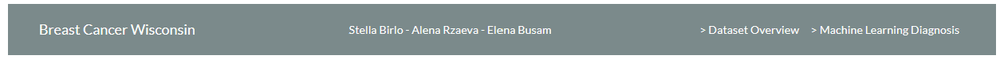

In [53]:
## Dasboard Navigation bar
NavBar =   dbc.Navbar(
        dbc.Container([dbc.NavbarBrand("Breast Cancer Wisconsin", href="https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data/data"),
                    html.Div(["Stella Birlo - Alena Rzaeva - Elena Busam"],style={"color" : "white"}),
                    dbc.Nav([
                    dbc.NavItem(dbc.NavLink("> Dataset Overview", href="http://127.0.0.1:11141/", active="exact")),
                    dbc.NavItem(dbc.NavLink("> Machine Learning Diagnosis", href="http://127.0.0.1:14446/", active="exact"))
                        ])
                        ]),color="dark",dark=True,sticky="top",className="mb-2")

In [54]:
# Selected features by feature engineering above
features = [
    'radius_mean', 'perimeter_mean', 'area_mean',
    'compactness_mean', 'concavity_mean', 'concave points_mean',
    'radius_se', 'perimeter_se', 'area_se',
    'radius_worst', 'perimeter_worst', 'area_worst',
    'compactness_worst', 'concavity_worst', 'concave points_worst'
]

### Funktion zum Erstellen der Slider-Reihen
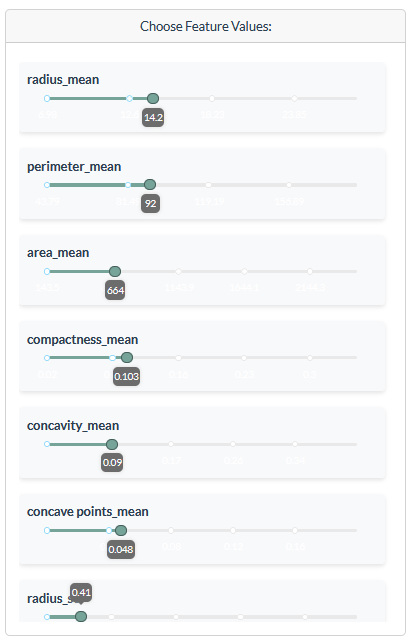

In [55]:
# Funktion zum Erstellen der Slider-Reihen
import numpy as np
def create_slider_rows(features, df, num_columns=1):
    rows = []
    for i in range(0, len(features), num_columns):
        row = html.Div([
            html.Div([
                 html.Label(feature, style={
                    'color': flatly_colors['text'],
                    'fontWeight': 'bold',
                    'marginBottom': '5px'
                }),
                dcc.Slider(
                    id=feature,
                    min=df[feature].min(),
                    max=df[feature].max(),
                    value=df[feature].mean(),
                    marks={i: {'label': str(round(i,2)), 'style': {'color': flatly_colors['background']}} 
                           for i in np.arange(df[feature].min(), df[feature].max(), df[feature].max() / 5)},
                    
                    tooltip={"always_visible": True  ,"placement": "bottom" },
                    className='flatly-slider'
                )
            ],
            style={
                'width': f'{100 / num_columns - 2}%', 
                'display': 'inline-block', 
                'padding': '10px',
                'backgroundColor': flatly_colors['light'],
                'borderRadius': '5px',
                'boxShadow': '0 2px 4px rgba(0,0,0,0.1)'
            }) 
            for feature in features[i:i + num_columns]
        ],
         style={'display': 'flex', 'justifyContent': 'space-between', 'marginBottom': '20px'})
        rows.append(row)
    return rows

### ML Model Choice Dropdown
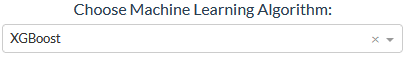

In [56]:
# ML Model Choice Dropdown
model_dd = dcc.Dropdown(
        id='dropdown_ML',
        options=[{'label': v, 'value': v} for v in ['Random Forest','XGBoost',"Neural Network"]],
        value='XGBoost',
        style={'width': '100%', 'margin': '10'}
    )

### # Table funktion for ML model metrics
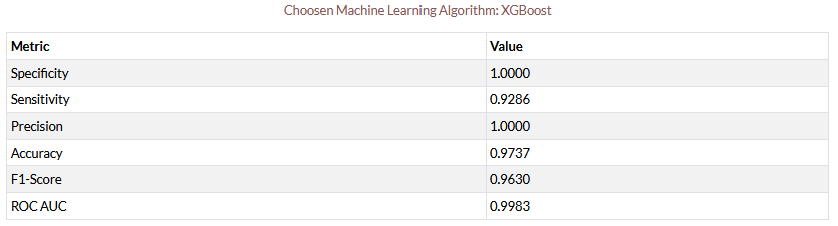

In [57]:
# Table funktion for ML model metrics
def create_metrics_table(metrics):
    return dbc.Table.from_dataframe(
        pd.DataFrame({
            'Metric': ['Specificity', 'Sensitivity', 'Precision', 'Accuracy', 'F1-Score', 'ROC AUC'],
            'Value': [f'{metrics[0]:.4f}', f'{metrics[1]:.4f}', f'{metrics[2]:.4f}', 
                      f'{metrics[3]:.4f}', f'{metrics[4]:.4f}', f'{metrics[5]:.4f}']
        }),
        striped=True,
        bordered=True,
        hover=True,
        responsive=True,
        className='table-sm'
    )

### Table function für ML diagnosis values 
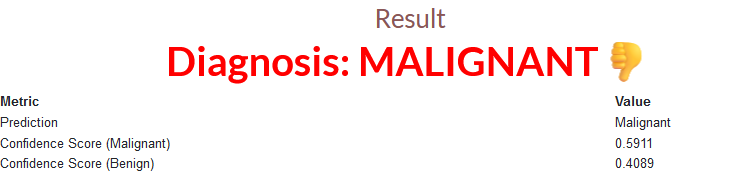

In [58]:
# Table function für ML diagnosis values 
def create_table(data):
    return html.Table([
        html.Thead(html.Tr([html.Th("Metric"), html.Th("Value")])),
        html.Tbody([
            html.Tr([html.Td(metric), html.Td(value)]) for metric, value in data
        ])
    ], style={
        'border-collapse': 'collapse',
        'width': '100%',
        'font-family': 'Arial, sans-serif'
    })

## Dash Page 2: Machine Learning Diagnosis #44446 <a id='page2_dash'></a>

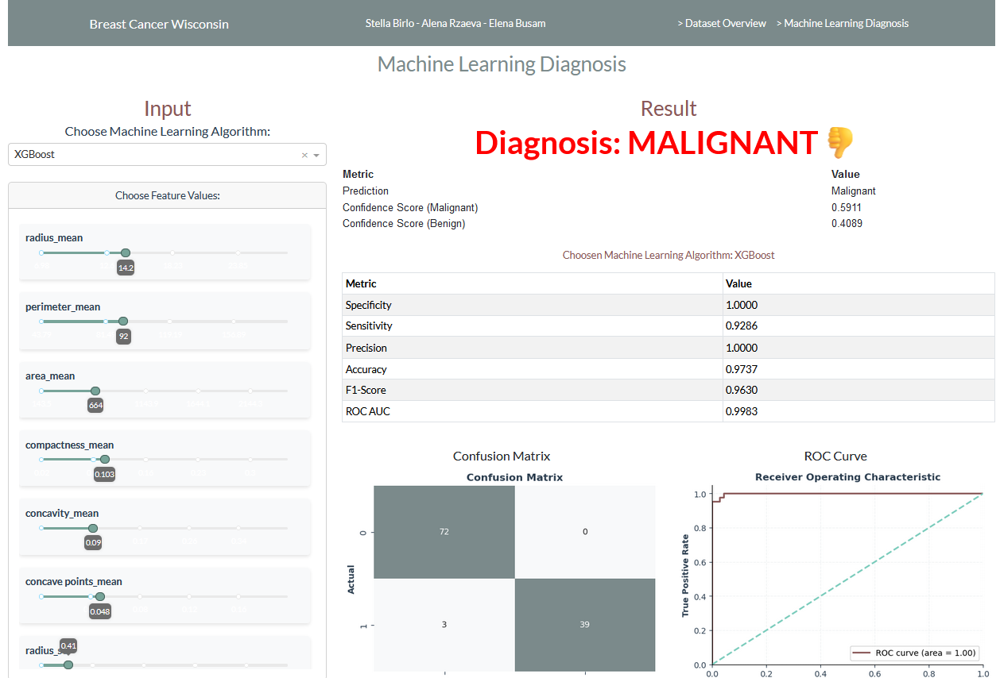

In [59]:
from dash import Dash, html, dcc, callback, Output, Input, dash_table
import plotly.express as px
import dash_bootstrap_components as dbc
import emoji

df = df_cleaned.copy()

app = Dash(external_stylesheets=[dbc.themes.FLATLY])

app.layout = dbc.Container([
    # Navigation bar
     dbc.Row([dbc.Col(NavBar)]),
    
    # Title
    dbc.Row([
        dbc.Col(html.H3("Machine Learning Diagnosis", className="text-center"), style={
            'color': flatly_colors['dark'],
            'padding': '0px',
            'border-radius': '5px',
            'margin-top': '0', 
           'margin-bottom': '0px' 
        })
    ]),
    
    # Main content
    dbc.Row([
        # Left column: ML Algorithm dropdown and Sliders in a scrollable card
        dbc.Col([html.H3("Input", className="text-center mb-1", style={"color":flatly_colors['accent1']}),
        # ML model choice via dropdown
            html.Div([
                html.H5("Choose Machine Learning Algorithm:", className="text-center mb-2", style={"color":flatly_colors['text']}),
                model_dd
            ], className="mb-4"),
            
        # Sliders in a scrollable card for feaure values
            dbc.Card([
                dbc.CardHeader("Choose Feature Values:", className="text-center mb-2", style={"color":flatly_colors['text']}),
                dbc.CardBody([
                    html.Div(
                        create_slider_rows(features, df),
                        style={'height': '700px', 'overflowY': 'auto'}
                    )
                ])
            ])
        ], width=4),  
        
        # Right column: ML Diagnosis result, table and ML model metrics
        dbc.Col([
        # ML Diagnosis result
            html.Div([
                html.H3("Result", className="text-center mb-1", style={"color":flatly_colors['accent1']}),
                html.H2(id='diagnosis-result', className="text-center mb-2")
            ]),
            
        # Results table
            html.Div(id='results-table', className="mb-4"),

        # Machine Learning Algorithm and Metrics header
            html.Div(id='ml-metrics-header', className="mt-4 mb-3"),
        # First row: Metrics table
        dbc.Row([
            dbc.Col([
                html.Div(id='metrics-table')
            ], width=12)
        ], className="mb-4"),
        
        # Second row: Confusion Matrix and ROC Curve side by side
        dbc.Row([
            # Confusion Matrix
            dbc.Col([
                html.H5("Confusion Matrix", className="text-center"),
                html.Img(id='confusion-matrix-plot', className="img-fluid")
            ], width=6),
            
            # ROC Curve
            dbc.Col([
                html.H5("ROC Curve", className="text-center"),
                html.Img(id='roc-curve-plot', className="img-fluid")
            ], width=6)
        ])

        ], width=8)  
    ], className="mt-4"),
], fluid=True, className="px-4 py-2")

#---------------------------------------------------------------
# Callback-Funktion

# Callback for ML Algorithms
@app.callback(
    Output('diagnosis-result', 'children'),
    Output('diagnosis-result', 'style'), 
    Output('results-table', 'children'),
    Input('dropdown_ML', 'value'),
    [Input(feature, 'value') for feature in features]
)
def update_model(selected_model, *values):
    print(f"Selected model: {selected_model}")
    print(f"Input values: {values}")
    
    ft_vals = np.array(values).reshape(1, -1)
    
    try:
        models = {
            "XGBoost": xgb_classifier,
            "Random Forest": rf_classifier,
            "Neural Network": sq_model
        }
        
        model = models.get(selected_model)
        if model is None:
            raise ValueError(f"Invalid model selected: {selected_model}")

        prediction = model.predict(ft_vals)
        confidence_score = model.predict_proba(ft_vals) if selected_model != "Neural Network" else model.predict(ft_vals)

        is_malignant = prediction[0] == 1 if selected_model != "Neural Network" else prediction[0] > 0.5
        
        table_data = [
            ("Prediction", 'Malignant' if is_malignant else 'Benign'),
            ("Confidence Score (Malignant)", f"{confidence_score[0][1]:.4f}" if selected_model != "Neural Network" else f"{confidence_score[0][0]:.4f}"),
            ("Confidence Score (Benign)", f"{confidence_score[0][0]:.4f}" if selected_model != "Neural Network" else f"{1-confidence_score[0][0]:.4f}"),
        ]
        
        table = create_table(table_data)
        
        diagnosis = "MALIGNANT" + emoji.emojize(':thumbs_down:') if is_malignant else "BENIGN" + emoji.emojize(':thumbs_up:')
        diagnosis_color = "red" if is_malignant else "green"
        diagnosis_result = f"Diagnosis: {diagnosis}"
        diagnosis_style = {'color': diagnosis_color, 'fontSize': '50px', 'fontWeight': 'bold'}

        return diagnosis_result, diagnosis_style, table
    
    except Exception as e:
        print(f"Error details: {str(e)}")
        return f"Ein Fehler ist aufgetreten: {str(e)}", {}, None

#--------------------------------------------
# callback für ML Algorithmus Metriken
@app.callback(
    [Output('ml-metrics-header', 'children'),
     Output('metrics-table', 'children'),
     Output('confusion-matrix-plot', 'src'),
     Output('roc-curve-plot', 'src')],
    [Input('dropdown_ML', 'value')]
)
def update_metrics_and_plots(selected_model):
    if selected_model == "XGBoost":
        results = results_xgb
    elif selected_model == "Random Forest":
        results = results_rf
    elif selected_model == "Neural Network":
        results = results_sq
    else:
        return "Invalid model selected", None, None, None

    header = [
        html.Div(f"Choosen Machine Learning Algorithm: {selected_model}", 
                 className="text-center",
                 style={"color":flatly_colors['accent1'],"size":5})
    ]
    
    table = create_metrics_table(results['metrics'])
    
    confusion_matrix_src = f"data:image/png;base64,{results['confusion_matrix_plot']}"
    roc_curve_src = f"data:image/png;base64,{results['roc_curve_plot']}"
    
    return header, table, confusion_matrix_src, roc_curve_src

def create_metrics_table(metrics):
    return dbc.Table.from_dataframe(
        pd.DataFrame({
            'Metric': list(metrics.keys()),
            'Value': [f'{value:.4f}' for value in metrics.values()]
        }),
        striped=True,
        bordered=True,
        hover=True,
        responsive=True,
        className='table-sm'
    )

## Slider Style
app.index_string = '''
<!DOCTYPE html>
<html>
    <head>
        {%metas%}
        <title>{%title%}</title>
        {%favicon%}
        {%css%}
        <style>
            .flatly-slider .rc-slider-track {
                background-color: #77a499;
            }
            .flatly-slider .rc-slider-handle {
                border-color: #435b56;
                background-color: #77a499;
            }
            .flatly-slider .rc-slider-handle:hover {
                border-color: #77a499;
            }
            .flatly-slider .rc-slider-handle:active {
                border-color: #77a499;
                box-shadow: 0 0 5px #1ABC9C;
            }
            .flatly-slider .rc-slider-mark-text {
                color: #7B8A8B;
            }
        </style>
    </head>
    <body>
        {%app_entry%}
        <footer>
            {%config%}
            {%scripts%}
            {%renderer%}
        </footer>
    </body>
</html>
'''
        
       
if __name__ == "__main__":
    app.run_server(debu=True, port=14446, jupyter_mode = "tab")

Dash app running on http://127.0.0.1:14446/


<IPython.core.display.Javascript object>

Selected model: XGBoost
Input values: (14.127291739894552, 91.96903339191564, 654.8891036906855, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


## Dash Page 1: Data Overview # 11121 <a id='page1_dash'></a>

### Dataset explaination pictures
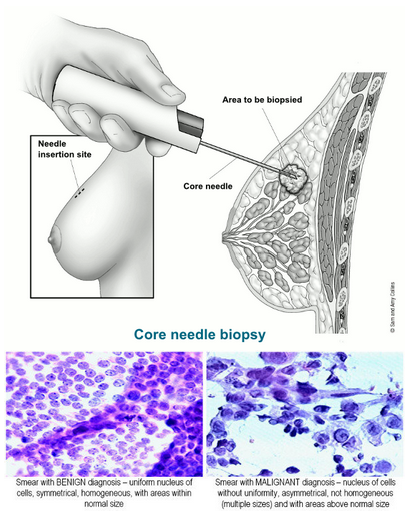

In [60]:
# Dataset explaination pictures

boob2 = "https://www.cancer.org/adobe/dynamicmedia/deliver/dm-aid--462f5161-c25f-4beb-877b-25f2aa61c3ac/core-needle-biopsy.gif?quality=82&preferwebp=true&width=1440"
Zell_Bild_Link = "https://www.researchgate.net/publication/232811011/figure/fig3/AS:214220353347586@1428085520095/Captured-images-of-layers-of-glass-with-smears-of-breast-mass-obtained-by-FNA-the-parts.png"
b_pic =  html.Img(src=boob2,width=400)
c_pic =  html.Img(src=Zell_Bild_Link,width=400)
     

### Card to choose X und Y for scatter plot
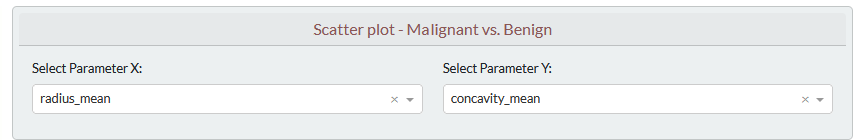

In [61]:
# Card to choose X und Y for scatter plot 
control = dbc.Card([
    dbc.CardHeader(
        html.H5("Scatter plot - Malignant vs. Benign", className="text-center mb-0",style={"color":flatly_colors['accent1']})
    ),
    dbc.CardBody([
        dbc.Row([
            dbc.Col([   
                dbc.Label("Select Parameter X:", className="font-weight-bold"),
                dcc.Dropdown(
                    id="select_parameter_x",
                    value="radius_mean",
                    options=[{"label": i, "value": i} for i in df.iloc[:,1:].columns],
                    className="mb-2"
                ),
            ], md=6),
            dbc.Col([
                dbc.Label("Select Parameter Y:", className="font-weight-bold"),
                dcc.Dropdown(
                    id="select_parameter_y",
                    value="concavity_mean",
                    options=[{"label": i, "value": i} for i in df.iloc[:,1:].columns],
                    className="mb-2"
                ),
            ], md=6)
        ])
    ])
],  className="p-2", color="light")


### filterable table of dataset
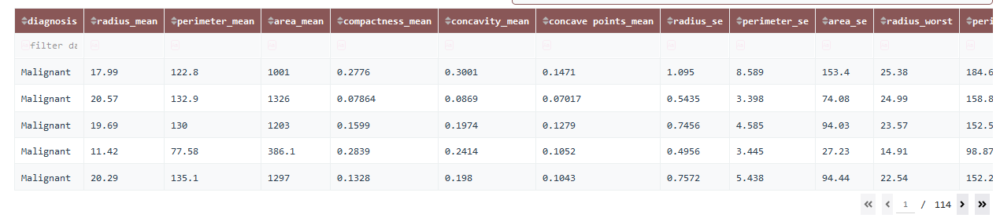

In [62]:
# filterable table of dataset
dff = df_cleaned.copy()
df_table = dash_table.DataTable(
                id='dataset-table',
                columns=[{"name": i, "id": i} for i in dff.columns],
                data=dff.to_dict('records'),
                page_size=5, 
                sort_mode='multi',
                selected_rows=[],
                style_table={'overflowX': 'auto'},
                style_header={
                    'backgroundColor': flatly_colors['accent1'],
                    'color': 'white',
                    'fontWeight': 'bold'
                },
                style_cell={
                    'backgroundColor': flatly_colors['light'],
                    'color': flatly_colors['text'],
                    'border': f'1px solid {flatly_colors["grid"]}',
                    'padding': '10px',
                    'textAlign': 'left'
                },
                style_data_conditional=[
                    {
                        'if': {'row_index': 'odd'},
                        'backgroundColor': flatly_colors['background']
                    }
                ],
                sort_action='native',  
                filter_action='native', 
                page_action='native',  
            )

### Scatter Plot Test

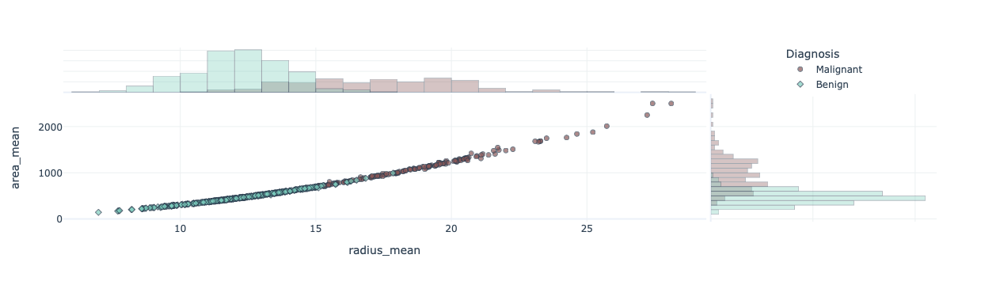

In [63]:
# Scatter Plot Test
xx = "radius_mean"
yy = "area_mean"
dff["diagnosis"] = dff["diagnosis"].replace({0: "Benign", 1: "Malignant"})
    
color_discrete_map = {'Malignant': flatly_colors['accent1'], 'Benign': flatly_colors['accent2']}
scat_fig = px.scatter(dff, x=xx, y=yy, color="diagnosis", symbol="diagnosis",
                          template="flatly_custom",
                          marginal_x="histogram", marginal_y="histogram",
                          color_discrete_map=color_discrete_map)

scat_fig.update_layout(
        legend=dict(orientation="v", yanchor="bottom", y=0.72, xanchor="right", x=0.92, title="Diagnosis"),
        xaxis_title=str(xx),
        yaxis_title=str(yy),
        dragmode='select'
    )

scat_fig.update_traces(marker=dict(opacity=0.7, line=dict(width=1, color=flatly_colors['text'])))

### Reset button for table
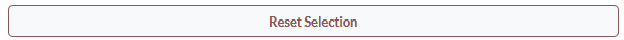

In [64]:
# reset button for table
reset_button = html.Button(
    'Reset Selection', 
    id='reset-button_tab', 
    n_clicks=0,
    className='btn btn-primary',
    style={
        'backgroundColor': flatly_colors['light'],
        'borderColor': flatly_colors['accent1'],
        'color': flatly_colors['accent1'],
        'fontWeight': 'bold',
        'marginBottom': '5px',
        'marginTop': '5px',
        'width': '100%',  # Setzt die Breite auf 50% des Elternelements
        'display': 'block',  # Macht den Button zu einem Block-Element
        'marginLeft': 'auto',  # Zentriert den Button
        'marginRight': 'auto'  # Zentriert den Button
    }
)


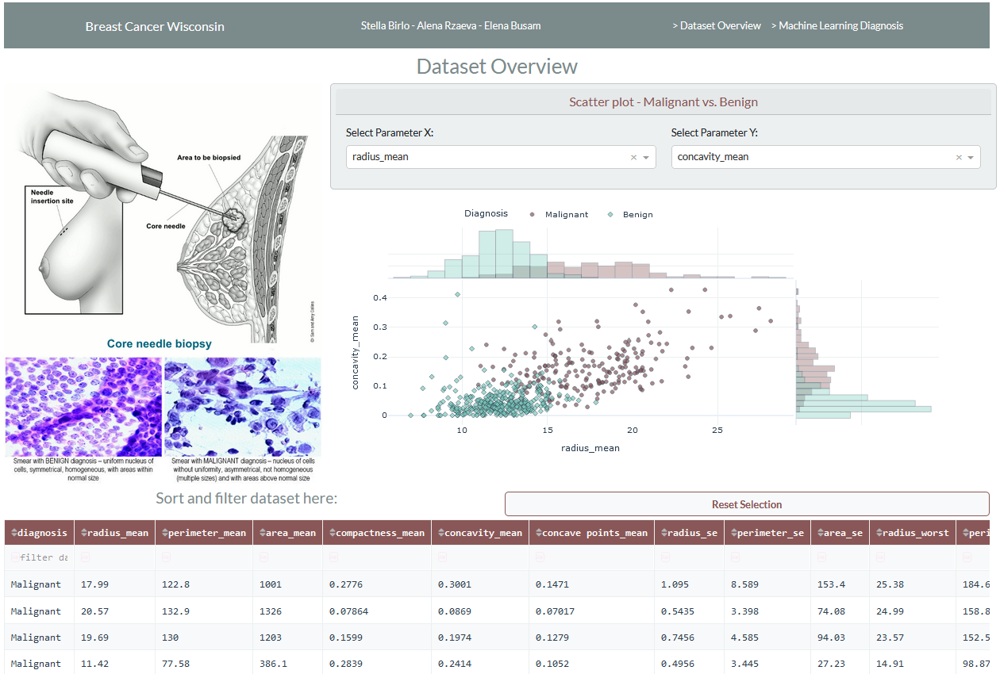

In [65]:
df = df_cleaned.copy()
dff = df.copy()
dff["diagnosis"] = dff["diagnosis"].replace({0: "Benign", 1: "Malignant"})
app = Dash(external_stylesheets=[dbc.themes.FLATLY])

app.layout = dbc.Container([
    # Naviation bar
    dbc.Row([dbc.Col(NavBar)]),
    # Title
    dbc.Row(html.H3("Dataset Overview", className="text-center"), style={
            'color': flatly_colors['dark'],
            'padding': '0px',
            'border-radius': '5px',
            'margin-top': '0', 
           'margin-bottom': '0px' 
        }),
    # Main
    dbc.Row([    
        # Picures on left side
        dbc.Col([
                dbc.Row([b_pic,c_pic])], width=4),
        # X/Y-Card and Scatter plot on right side
        dbc.Col([
                dbc.Row([control,
                dcc.Graph(id="scat-plot", selectedData=None)
                        ])
                ])
                ], className="mb-2"),
    # Bottom table of dataset
    dbc.Row([ 
        dbc.Col([
        html.H4("Sort and filter dataset here:", className="text-center", style={
            'color': flatly_colors['dark'],
            'padding': '0px',
            'border-radius': '1px',
            'margin-top': '0', 
           'margin-bottom': '3px'})
        ]),
        dbc.Col([
        reset_button
        ]),
        df_table
        ])
    
], fluid=True, className="px-4 py-2")

#------------------------------------------------------------------
# Callback-Funktion

# Callback for scatter plot
@app.callback(
    Output('scat-plot', 'figure'),
    Input('select_parameter_x', 'value'),
    Input('select_parameter_y', 'value')
)
def update_graph(x_param, y_param):
    dff = df.copy()
    dff["diagnosis"] = dff["diagnosis"].replace({0: "Benign", 1: "Malignant"})
    xx = x_param
    yy = y_param
    color_discrete_map = {'Malignant': flatly_colors['accent1'], 'Benign': flatly_colors['accent2']}
    scat_fig = px.scatter(dff, x=xx, y=yy, color="diagnosis", symbol="diagnosis",
                          template="flatly_custom",
                          marginal_x="histogram", marginal_y="histogram",
                          color_discrete_map=color_discrete_map)

    scat_fig.update_layout(
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=0.5, title="Diagnosis"),
        xaxis_title=str(xx),
        yaxis_title=str(yy),
        dragmode='select' 
    )

    scat_fig.update_traces(marker=dict(opacity=0.7, line=dict(width=1, color=flatly_colors['text'])))
    return scat_fig


# Callback for table filters
@app.callback(
    Output('dataset-table', 'data'),
    Input('scat-plot', 'selectedData'),
    Input('select_parameter_x', 'value'),
    Input('select_parameter_y', 'value')
)
def update_table(selectedData, x_param, y_param):
    dff = df.copy()
    dff["diagnosis"] = dff["diagnosis"].replace({0: "Benign", 1: "Malignant"})
    
    if selectedData and selectedData['points']:
        points = selectedData['points']
        filtered_indices = [p['pointIndex'] for p in points]
        filtered_df = dff.iloc[filtered_indices]
    else:
        filtered_df = dff

    return filtered_df.to_dict('records')
    
# Callback for table filters reset button
@app.callback(
    Output('scat-plot', 'selectedData'),
    Input('reset-button_tab', 'n_clicks')
)
def reset_selection(n_clicks):
    return None


#------------------------------------------------------------------

if __name__ == "__main__":
    app.run_server(debu=True, port=11141, jupyter_mode = "tab")

Dash app running on http://127.0.0.1:11141/


<IPython.core.display.Javascript object>

Selected model: XGBoost
Input values: (14.127291739894552, 91.96903339191564, 654.8891036906855, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)
Selected model: XGBoost
Input values: (14.127291739894552, 91.96903339191564, 654.8891036906855, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)
Selected model: Random Forest
Input values: (14.127291739894552, 91.96903339191564, 654.8891036906855, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (12.4, 91.96903339191564, 654.8891036906855, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (17.8, 91.96903339191564, 654.8891036906855, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (17.8, 176, 654.8891036906855, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (17.8, 176, 2464, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (17.8, 176, 2104, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (25.8, 176, 2104, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (25.8, 176, 2104, 0.269, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (10.2, 176, 2104, 0.269, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 176, 2104, 0.269, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 80, 2104, 0.269, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 80, 824, 0.269, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 80, 824, 0.071, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 80, 484, 0.071, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 78, 484, 0.071, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 78, 484, 0.345, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 78, 484, 0.345, 0.37, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 78, 484, 0.345, 0.37, 0.152, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 78, 484, 0.345, 0.37, 0.152, 0.40517205623901575, 9.2, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: Random Forest
Input values: (11.4, 78, 484, 0.345, 0.37, 0.152, 1.45, 9.2, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)


/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



Selected model: XGBoost
Input values: (11.4, 78, 484, 0.345, 0.37, 0.152, 1.45, 9.2, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)
Selected model: XGBoost
Input values: (14.127291739894552, 91.96903339191564, 654.8891036906855, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)
Selected model: XGBoost
Input values: (24, 91.96903339191564, 654.8891036906855, 0.10434098418277679, 0.0887993158172232, 0.04891914586994728, 0.40517205623901575, 2.8660592267135327, 40.337079086116, 16.269189806678387, 107.26121265377857, 880.5831282952548, 0.25426504393673116, 0.27218848330404216, 0.11460622319859401)
Selected model: XGBoost
Input values: (24, 162, 654.8891036906855, 0.10434098418277679, 0.0887993158172232, 0.0489

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

/Users/alenarzaeva/anaconda3/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names

